### Pull docker image from ECR 
* get aws account related variables such as account id and region 
* compose the full docker image name 
* pull it 

In [4]:
%%bash 

algorithm_name=yolo-tensorflow
account=$(aws sts get-caller-identity --query Account --output text)
echo ${region}
region=$(aws configure get region)
echo ${region}
fullname="${account}.dkr.ecr.${region}.amazonaws.com/${algorithm_name}:latest" 
$(aws ecr get-login --region ${region} --no-include-email)
docker pull ${fullname}


us-east-1
Login Succeeded
latest: Pulling from yolo-tensorflow
Digest: sha256:8e82cfa89c50f221005a7808b4b1112565b68d05f0af72f6c4c983e915d90b13
Status: Image is up to date for 230755935769.dkr.ecr.us-east-1.amazonaws.com/yolo-tensorflow:latest


WARNING! Using --password via the CLI is insecure. Use --password-stdin.
WARNING! Your password will be stored unencrypted in /home/ec2-user/.docker/config.json.
Configure a credential helper to remove this warning. See
https://docs.docker.com/engine/reference/commandline/login/#credentials-store



#### training data file structure 
* files under cfg - data descriptors and model config 
* files under dinfo - link to training images 
* files under train2014 - image files and labels 

In [57]:
import os 
def list_files(startpath):
    for root, dirs, files in os.walk(startpath):
        level = root.replace(startpath, '').count(os.sep)
        indent = ' ' * 4 * (level)
        print('{}{}/'.format(indent, os.path.basename(root)))
        subindent = ' ' * 4 * (level + 1)
        for f in files:
            print('{}{}'.format(subindent, f))
            
list_files('/home/ec2-user/SageMaker/opt/')            

/
ml/
    code/
    input/
        data/
            yolo_model/
                yolov4.conv.137
                csdarknet53-omega_final.weights
            cfg/
                coco.data
                yolov4.cfg
            dinfo/
                trainvalno5k.part
                trainvalno5k.txt
                coco.names
            train2014/
                COCO_train2014_000000314852.txt
                COCO_train2014_000000227918.txt
                COCO_train2014_000000261729.txt
                COCO_train2014_000000043919.txt
                COCO_train2014_000000248789.jpg
                COCO_train2014_000000161796.txt
                COCO_train2014_000000041940.txt
                COCO_train2014_000000257576.jpg
                COCO_train2014_000000441674.txt
                COCO_train2014_000000427526.jpg
                COCO_train2014_000000490985.txt
                COCO_train2014_000000348480.txt
                COCO_train2014_000000060780.txt
                COCO_trai

                COCO_train2014_000000009038.jpg
                COCO_train2014_000000278963.jpg
                COCO_train2014_000000092066.txt
                COCO_train2014_000000354626.txt
                COCO_train2014_000000541408.jpg
                COCO_train2014_000000482959.jpg
                COCO_train2014_000000344477.jpg
                COCO_train2014_000000537765.txt
                COCO_train2014_000000190084.txt
                COCO_train2014_000000246761.txt
                COCO_train2014_000000515387.jpg
                COCO_train2014_000000530781.txt
                COCO_train2014_000000067230.txt
                COCO_train2014_000000576801.txt
                COCO_train2014_000000390723.jpg
                COCO_train2014_000000517597.jpg
                COCO_train2014_000000028876.txt
                COCO_train2014_000000578026.jpg
                COCO_train2014_000000149095.jpg
                COCO_train2014_000000085939.jpg
                COCO_train2014_000000399

                COCO_train2014_000000306145.txt
                COCO_train2014_000000297257.txt
                COCO_train2014_000000310338.jpg
                COCO_train2014_000000319451.txt
                COCO_train2014_000000366058.txt
                COCO_train2014_000000083153.jpg
                COCO_train2014_000000199244.jpg
                COCO_train2014_000000114230.txt
                COCO_train2014_000000411554.txt
                COCO_train2014_000000033111.txt
                COCO_train2014_000000517594.jpg
                COCO_train2014_000000547448.txt
                COCO_train2014_000000466247.jpg
                COCO_train2014_000000098939.txt
                COCO_train2014_000000495957.jpg
                COCO_train2014_000000350953.jpg
                COCO_train2014_000000472740.jpg
                COCO_train2014_000000325806.jpg
                COCO_train2014_000000396958.txt
                COCO_train2014_000000163992.txt
                COCO_train2014_000000562

                COCO_train2014_000000268654.jpg
                COCO_train2014_000000291476.jpg
                COCO_train2014_000000098064.jpg
                COCO_train2014_000000533055.jpg
                COCO_train2014_000000474764.jpg
                COCO_train2014_000000394756.jpg
                COCO_train2014_000000333739.jpg
                COCO_train2014_000000052518.txt
                COCO_train2014_000000579065.jpg
                COCO_train2014_000000156467.txt
                COCO_train2014_000000489723.txt
                COCO_train2014_000000315743.txt
                COCO_train2014_000000391748.jpg
                COCO_train2014_000000048223.txt
                COCO_train2014_000000320129.txt
                COCO_train2014_000000419587.txt
                COCO_train2014_000000203870.jpg
                COCO_train2014_000000436046.txt
                COCO_train2014_000000481954.jpg
                COCO_train2014_000000000670.jpg
                COCO_train2014_000000511

                COCO_train2014_000000402071.txt
                COCO_train2014_000000455444.jpg
                COCO_train2014_000000410535.txt
                COCO_train2014_000000187611.txt
                COCO_train2014_000000061044.jpg
                COCO_train2014_000000269946.txt
                COCO_train2014_000000309953.jpg
                COCO_train2014_000000092794.jpg
                COCO_train2014_000000128121.txt
                COCO_train2014_000000200280.txt
                COCO_train2014_000000489617.jpg
                COCO_train2014_000000551858.jpg
                COCO_train2014_000000574527.jpg
                COCO_train2014_000000099466.jpg
                COCO_train2014_000000466402.jpg
                COCO_train2014_000000379279.txt
                COCO_train2014_000000041461.txt
                COCO_train2014_000000097849.txt
                COCO_train2014_000000581481.jpg
                COCO_train2014_000000437510.jpg
                COCO_train2014_000000414

                COCO_train2014_000000253584.jpg
                COCO_train2014_000000326313.txt
                COCO_train2014_000000119093.txt
                COCO_train2014_000000473040.jpg
                COCO_train2014_000000496386.jpg
                COCO_train2014_000000535327.txt
                COCO_train2014_000000352006.txt
                COCO_train2014_000000058979.txt
                COCO_train2014_000000135733.jpg
                COCO_train2014_000000064908.txt
                COCO_train2014_000000433021.jpg
                COCO_train2014_000000572475.txt
                COCO_train2014_000000027136.jpg
                COCO_train2014_000000345100.jpg
                COCO_train2014_000000018179.txt
                COCO_train2014_000000289690.txt
                COCO_train2014_000000369869.txt
                COCO_train2014_000000043919.jpg
                COCO_train2014_000000123568.txt
                COCO_train2014_000000562388.txt
                COCO_train2014_000000021

                COCO_train2014_000000354863.jpg
                COCO_train2014_000000565361.txt
                COCO_train2014_000000214899.jpg
                COCO_train2014_000000332721.jpg
                COCO_train2014_000000509698.txt
                COCO_train2014_000000183626.jpg
                COCO_train2014_000000338971.txt
                COCO_train2014_000000428271.txt
                COCO_train2014_000000027340.txt
                COCO_train2014_000000310457.txt
                COCO_train2014_000000530658.jpg
                COCO_train2014_000000475874.txt
                COCO_train2014_000000443999.txt
                COCO_train2014_000000121302.txt
                COCO_train2014_000000242145.jpg
                COCO_train2014_000000044603.txt
                COCO_train2014_000000039027.txt
                COCO_train2014_000000463467.txt
                COCO_train2014_000000540122.jpg
                COCO_train2014_000000547985.txt
                COCO_train2014_000000224

                COCO_train2014_000000080518.txt
                COCO_train2014_000000405361.txt
                COCO_train2014_000000490992.txt
                COCO_train2014_000000396247.txt
                COCO_train2014_000000091276.jpg
                COCO_train2014_000000447204.txt
                COCO_train2014_000000344885.txt
                COCO_train2014_000000496434.jpg
                COCO_train2014_000000319522.txt
                COCO_train2014_000000386927.jpg
                COCO_train2014_000000145502.txt
                COCO_train2014_000000572456.jpg
                COCO_train2014_000000340343.txt
                COCO_train2014_000000288559.txt
                COCO_train2014_000000048931.txt
                COCO_train2014_000000129865.jpg
                COCO_train2014_000000028525.jpg
                COCO_train2014_000000423818.jpg
                COCO_train2014_000000180587.jpg
                COCO_train2014_000000542630.jpg
                COCO_train2014_000000416

                COCO_train2014_000000575164.txt
                COCO_train2014_000000545364.txt
                COCO_train2014_000000436214.jpg
                COCO_train2014_000000243072.jpg
                COCO_train2014_000000280156.txt
                COCO_train2014_000000044928.jpg
                COCO_train2014_000000401625.jpg
                COCO_train2014_000000314462.txt
                COCO_train2014_000000310633.txt
                COCO_train2014_000000025374.txt
                COCO_train2014_000000011673.txt
                COCO_train2014_000000392971.jpg
                COCO_train2014_000000555794.jpg
                COCO_train2014_000000474168.txt
                COCO_train2014_000000009975.jpg
                COCO_train2014_000000009709.jpg
                COCO_train2014_000000037527.jpg
                COCO_train2014_000000283965.jpg
                COCO_train2014_000000187168.txt
                COCO_train2014_000000438462.jpg
                COCO_train2014_000000146

                COCO_train2014_000000221200.jpg
                COCO_train2014_000000012154.jpg
                COCO_train2014_000000521800.jpg
                COCO_train2014_000000296040.jpg
                COCO_train2014_000000481874.txt
                COCO_train2014_000000407112.jpg
                COCO_train2014_000000459794.txt
                COCO_train2014_000000038955.jpg
                COCO_train2014_000000403473.txt
                COCO_train2014_000000092835.jpg
                COCO_train2014_000000515315.txt
                COCO_train2014_000000304314.jpg
                COCO_train2014_000000095872.jpg
                COCO_train2014_000000580765.jpg
                COCO_train2014_000000098563.jpg
                COCO_train2014_000000182571.jpg
                COCO_train2014_000000481292.txt
                COCO_train2014_000000185287.jpg
                COCO_train2014_000000283888.txt
                COCO_train2014_000000540030.jpg
                COCO_train2014_000000339

                COCO_train2014_000000391439.jpg
                COCO_train2014_000000236650.txt
                COCO_train2014_000000375659.jpg
                COCO_train2014_000000297131.txt
                COCO_train2014_000000052978.txt
                COCO_train2014_000000577843.txt
                COCO_train2014_000000389638.jpg
                COCO_train2014_000000339927.jpg
                COCO_train2014_000000287934.jpg
                COCO_train2014_000000429119.jpg
                COCO_train2014_000000429971.txt
                COCO_train2014_000000572109.txt
                COCO_train2014_000000487781.jpg
                COCO_train2014_000000225313.txt
                COCO_train2014_000000274467.jpg
                COCO_train2014_000000322804.txt
                COCO_train2014_000000460661.txt
                COCO_train2014_000000133456.txt
                COCO_train2014_000000291348.jpg
                COCO_train2014_000000524905.jpg
                COCO_train2014_000000374

                COCO_train2014_000000148276.txt
                COCO_train2014_000000059489.jpg
                COCO_train2014_000000581136.txt
                COCO_train2014_000000541314.txt
                COCO_train2014_000000398037.txt
                COCO_train2014_000000498337.txt
                COCO_train2014_000000482326.jpg
                COCO_train2014_000000169318.jpg
                COCO_train2014_000000433941.jpg
                COCO_train2014_000000391700.jpg
                COCO_train2014_000000525700.jpg
                COCO_train2014_000000503227.txt
                COCO_train2014_000000398433.txt
                COCO_train2014_000000092714.txt
                COCO_train2014_000000505852.txt
                COCO_train2014_000000224522.jpg
                COCO_train2014_000000311337.jpg
                COCO_train2014_000000575534.jpg
                COCO_train2014_000000076414.jpg
                COCO_train2014_000000484074.jpg
                COCO_train2014_000000119

                COCO_train2014_000000486328.txt
                COCO_train2014_000000486606.jpg
                COCO_train2014_000000096192.txt
                COCO_train2014_000000514218.txt
                COCO_train2014_000000443733.jpg
                COCO_train2014_000000395974.jpg
                COCO_train2014_000000339916.jpg
                COCO_train2014_000000041459.jpg
                COCO_train2014_000000074316.txt
                COCO_train2014_000000547767.txt
                COCO_train2014_000000570390.txt
                COCO_train2014_000000144869.jpg
                COCO_train2014_000000549527.jpg
                COCO_train2014_000000373076.jpg
                COCO_train2014_000000347990.txt
                COCO_train2014_000000338549.jpg
                COCO_train2014_000000538965.txt
                COCO_train2014_000000342174.txt
                COCO_train2014_000000040572.txt
                COCO_train2014_000000250849.txt
                COCO_train2014_000000421

                COCO_train2014_000000496269.txt
                COCO_train2014_000000303629.jpg
                COCO_train2014_000000173157.txt
                COCO_train2014_000000005139.jpg
                COCO_train2014_000000099964.jpg
                COCO_train2014_000000360332.jpg
                COCO_train2014_000000413782.txt
                COCO_train2014_000000395097.jpg
                COCO_train2014_000000459037.txt
                COCO_train2014_000000110431.jpg
                COCO_train2014_000000326493.jpg
                COCO_train2014_000000433163.jpg
                COCO_train2014_000000554066.jpg
                COCO_train2014_000000313082.jpg
                COCO_train2014_000000155402.txt
                COCO_train2014_000000325584.jpg
                COCO_train2014_000000396998.jpg
                COCO_train2014_000000206427.txt
                COCO_train2014_000000537920.jpg
                COCO_train2014_000000242526.jpg
                COCO_train2014_000000552

                COCO_train2014_000000480010.txt
                COCO_train2014_000000041742.jpg
                COCO_train2014_000000267870.txt
                COCO_train2014_000000184720.txt
                COCO_train2014_000000245139.txt
                COCO_train2014_000000173620.jpg
                COCO_train2014_000000449781.jpg
                COCO_train2014_000000499738.jpg
                COCO_train2014_000000069169.jpg
                COCO_train2014_000000157875.jpg
                COCO_train2014_000000363333.txt
                COCO_train2014_000000258753.jpg
                COCO_train2014_000000245682.txt
                COCO_train2014_000000038257.txt
                COCO_train2014_000000064797.txt
                COCO_train2014_000000080585.jpg
                COCO_train2014_000000475006.txt
                COCO_train2014_000000117555.txt
                COCO_train2014_000000411063.jpg
                COCO_train2014_000000256915.jpg
                COCO_train2014_000000364

                COCO_train2014_000000562807.jpg
                COCO_train2014_000000426388.jpg
                COCO_train2014_000000041079.jpg
                COCO_train2014_000000549563.txt
                COCO_train2014_000000069383.jpg
                COCO_train2014_000000035374.txt
                COCO_train2014_000000011004.jpg
                COCO_train2014_000000300636.txt
                COCO_train2014_000000344075.txt
                COCO_train2014_000000345987.txt
                COCO_train2014_000000226664.txt
                COCO_train2014_000000200033.jpg
                COCO_train2014_000000236882.txt
                COCO_train2014_000000559162.txt
                COCO_train2014_000000346049.txt
                COCO_train2014_000000183690.txt
                COCO_train2014_000000194437.txt
                COCO_train2014_000000566395.txt
                COCO_train2014_000000512533.txt
                COCO_train2014_000000519759.jpg
                COCO_train2014_000000501

                COCO_train2014_000000024625.jpg
                COCO_train2014_000000353590.txt
                COCO_train2014_000000332606.txt
                COCO_train2014_000000375899.jpg
                COCO_train2014_000000458705.jpg
                COCO_train2014_000000137787.txt
                COCO_train2014_000000202364.txt
                COCO_train2014_000000308423.txt
                COCO_train2014_000000559859.txt
                COCO_train2014_000000466536.txt
                COCO_train2014_000000206685.txt
                COCO_train2014_000000279957.txt
                COCO_train2014_000000172574.txt
                COCO_train2014_000000188350.jpg
                COCO_train2014_000000283355.txt
                COCO_train2014_000000485499.jpg
                COCO_train2014_000000116049.jpg
                COCO_train2014_000000559865.jpg
                COCO_train2014_000000174504.txt
                COCO_train2014_000000307158.jpg
                COCO_train2014_000000366

                COCO_train2014_000000559425.jpg
                COCO_train2014_000000437525.jpg
                COCO_train2014_000000380258.txt
                COCO_train2014_000000415669.txt
                COCO_train2014_000000312763.txt
                COCO_train2014_000000032667.txt
                COCO_train2014_000000198546.txt
                COCO_train2014_000000112053.jpg
                COCO_train2014_000000228334.jpg
                COCO_train2014_000000515206.jpg
                COCO_train2014_000000512449.txt
                COCO_train2014_000000029962.jpg
                COCO_train2014_000000545163.txt
                COCO_train2014_000000533315.txt
                COCO_train2014_000000291066.txt
                COCO_train2014_000000316075.jpg
                COCO_train2014_000000137072.txt
                COCO_train2014_000000351104.txt
                COCO_train2014_000000179904.txt
                COCO_train2014_000000174410.txt
                COCO_train2014_000000287

                COCO_train2014_000000524486.txt
                COCO_train2014_000000003668.jpg
                COCO_train2014_000000336448.txt
                COCO_train2014_000000403463.txt
                COCO_train2014_000000475626.jpg
                COCO_train2014_000000086205.txt
                COCO_train2014_000000092346.txt
                COCO_train2014_000000427137.jpg
                COCO_train2014_000000371007.txt
                COCO_train2014_000000068914.jpg
                COCO_train2014_000000500324.txt
                COCO_train2014_000000225591.txt
                COCO_train2014_000000029801.jpg
                COCO_train2014_000000356083.txt
                COCO_train2014_000000486376.txt
                COCO_train2014_000000396792.jpg
                COCO_train2014_000000363433.txt
                COCO_train2014_000000058267.txt
                COCO_train2014_000000160610.txt
                COCO_train2014_000000147333.txt
                COCO_train2014_000000277

                COCO_train2014_000000567454.jpg
                COCO_train2014_000000135278.jpg
                COCO_train2014_000000466132.jpg
                COCO_train2014_000000240762.txt
                COCO_train2014_000000405523.jpg
                COCO_train2014_000000282793.jpg
                COCO_train2014_000000335440.jpg
                COCO_train2014_000000574696.jpg
                COCO_train2014_000000177289.txt
                COCO_train2014_000000262752.jpg
                COCO_train2014_000000045128.jpg
                COCO_train2014_000000532501.txt
                COCO_train2014_000000274239.txt
                COCO_train2014_000000178520.jpg
                COCO_train2014_000000084339.jpg
                COCO_train2014_000000082048.txt
                COCO_train2014_000000381810.jpg
                COCO_train2014_000000042079.txt
                COCO_train2014_000000266666.jpg
                COCO_train2014_000000423091.txt
                COCO_train2014_000000201

                COCO_train2014_000000576849.jpg
                COCO_train2014_000000431986.jpg
                COCO_train2014_000000183268.jpg
                COCO_train2014_000000071218.txt
                COCO_train2014_000000458611.jpg
                COCO_train2014_000000441828.txt
                COCO_train2014_000000066398.txt
                COCO_train2014_000000077797.jpg
                COCO_train2014_000000315873.txt
                COCO_train2014_000000131976.txt
                COCO_train2014_000000507479.txt
                COCO_train2014_000000143139.txt
                COCO_train2014_000000321048.txt
                COCO_train2014_000000230109.txt
                COCO_train2014_000000327616.jpg
                COCO_train2014_000000153397.jpg
                COCO_train2014_000000168332.txt
                COCO_train2014_000000032095.txt
                COCO_train2014_000000556176.jpg
                COCO_train2014_000000215840.txt
                COCO_train2014_000000041

                COCO_train2014_000000251474.jpg
                COCO_train2014_000000398040.txt
                COCO_train2014_000000348697.txt
                COCO_train2014_000000193578.jpg
                COCO_train2014_000000497567.txt
                COCO_train2014_000000145935.jpg
                COCO_train2014_000000033992.jpg
                COCO_train2014_000000456106.jpg
                COCO_train2014_000000576464.jpg
                COCO_train2014_000000364491.txt
                COCO_train2014_000000068953.txt
                COCO_train2014_000000319440.txt
                COCO_train2014_000000052183.jpg
                COCO_train2014_000000162650.txt
                COCO_train2014_000000517670.jpg
                COCO_train2014_000000510959.txt
                COCO_train2014_000000139817.txt
                COCO_train2014_000000045617.jpg
                COCO_train2014_000000497194.txt
                COCO_train2014_000000164043.jpg
                COCO_train2014_000000404

                COCO_train2014_000000443410.jpg
                COCO_train2014_000000446709.txt
                COCO_train2014_000000462750.txt
                COCO_train2014_000000380827.txt
                COCO_train2014_000000135332.txt
                COCO_train2014_000000106585.txt
                COCO_train2014_000000450162.jpg
                COCO_train2014_000000523468.jpg
                COCO_train2014_000000399585.jpg
                COCO_train2014_000000488745.jpg
                COCO_train2014_000000476093.txt
                COCO_train2014_000000540795.txt
                COCO_train2014_000000078770.txt
                COCO_train2014_000000144161.jpg
                COCO_train2014_000000031382.txt
                COCO_train2014_000000158515.jpg
                COCO_train2014_000000535468.txt
                COCO_train2014_000000246389.jpg
                COCO_train2014_000000318541.jpg
                COCO_train2014_000000211384.jpg
                COCO_train2014_000000021

                COCO_train2014_000000446813.txt
                COCO_train2014_000000410190.jpg
                COCO_train2014_000000422130.txt
                COCO_train2014_000000384326.txt
                COCO_train2014_000000342347.txt
                COCO_train2014_000000378066.txt
                COCO_train2014_000000539418.txt
                COCO_train2014_000000157397.txt
                COCO_train2014_000000516655.txt
                COCO_train2014_000000065334.jpg
                COCO_train2014_000000069257.jpg
                COCO_train2014_000000473815.txt
                COCO_train2014_000000044464.txt
                COCO_train2014_000000530906.txt
                COCO_train2014_000000368205.jpg
                COCO_train2014_000000180967.jpg
                COCO_train2014_000000400430.jpg
                COCO_train2014_000000379558.jpg
                COCO_train2014_000000070557.txt
                COCO_train2014_000000544234.txt
                COCO_train2014_000000384

                COCO_train2014_000000079552.txt
                COCO_train2014_000000004956.jpg
                COCO_train2014_000000111955.txt
                COCO_train2014_000000453689.jpg
                COCO_train2014_000000276265.txt
                COCO_train2014_000000306902.txt
                COCO_train2014_000000068290.txt
                COCO_train2014_000000427688.txt
                COCO_train2014_000000110324.jpg
                COCO_train2014_000000490027.txt
                COCO_train2014_000000568424.txt
                COCO_train2014_000000049603.jpg
                COCO_train2014_000000288964.jpg
                COCO_train2014_000000531983.txt
                COCO_train2014_000000060190.jpg
                COCO_train2014_000000251974.txt
                COCO_train2014_000000351480.jpg
                COCO_train2014_000000475663.txt
                COCO_train2014_000000330229.txt
                COCO_train2014_000000024728.jpg
                COCO_train2014_000000511

                COCO_train2014_000000447292.txt
                COCO_train2014_000000100169.jpg
                COCO_train2014_000000413088.txt
                COCO_train2014_000000465035.jpg
                COCO_train2014_000000437446.txt
                COCO_train2014_000000236841.jpg
                COCO_train2014_000000204806.jpg
                COCO_train2014_000000327181.jpg
                COCO_train2014_000000497698.jpg
                COCO_train2014_000000338210.txt
                COCO_train2014_000000403841.jpg
                COCO_train2014_000000581813.jpg
                COCO_train2014_000000431973.txt
                COCO_train2014_000000105200.jpg
                COCO_train2014_000000437831.txt
                COCO_train2014_000000111772.jpg
                COCO_train2014_000000513768.txt
                COCO_train2014_000000494854.txt
                COCO_train2014_000000165350.txt
                COCO_train2014_000000293371.jpg
                COCO_train2014_000000535

                COCO_train2014_000000158823.txt
                COCO_train2014_000000027988.txt
                COCO_train2014_000000115014.txt
                COCO_train2014_000000424705.txt
                COCO_train2014_000000241916.jpg
                COCO_train2014_000000217461.jpg
                COCO_train2014_000000367257.txt
                COCO_train2014_000000020150.jpg
                COCO_train2014_000000485629.jpg
                COCO_train2014_000000342140.jpg
                COCO_train2014_000000234236.jpg
                COCO_train2014_000000269790.txt
                COCO_train2014_000000218652.jpg
                COCO_train2014_000000282661.txt
                COCO_train2014_000000479068.txt
                COCO_train2014_000000519356.txt
                COCO_train2014_000000004971.jpg
                COCO_train2014_000000514902.txt
                COCO_train2014_000000246071.txt
                COCO_train2014_000000153340.txt
                COCO_train2014_000000015

                COCO_train2014_000000084137.txt
                COCO_train2014_000000038310.txt
                COCO_train2014_000000373664.txt
                COCO_train2014_000000252132.txt
                COCO_train2014_000000288099.txt
                COCO_train2014_000000335696.txt
                COCO_train2014_000000167740.txt
                COCO_train2014_000000184761.jpg
                COCO_train2014_000000258890.txt
                COCO_train2014_000000068147.jpg
                COCO_train2014_000000580932.txt
                COCO_train2014_000000282190.jpg
                COCO_train2014_000000156175.jpg
                COCO_train2014_000000579907.txt
                COCO_train2014_000000004057.jpg
                COCO_train2014_000000281772.jpg
                COCO_train2014_000000213677.jpg
                COCO_train2014_000000296159.txt
                COCO_train2014_000000253944.jpg
                COCO_train2014_000000432998.txt
                COCO_train2014_000000093

                COCO_train2014_000000446732.jpg
                COCO_train2014_000000107767.txt
                COCO_train2014_000000235905.txt
                COCO_train2014_000000234577.txt
                COCO_train2014_000000035630.jpg
                COCO_train2014_000000542950.jpg
                COCO_train2014_000000463665.jpg
                COCO_train2014_000000528840.jpg
                COCO_train2014_000000243382.jpg
                COCO_train2014_000000448812.txt
                COCO_train2014_000000580825.txt
                COCO_train2014_000000518180.jpg
                COCO_train2014_000000212780.jpg
                COCO_train2014_000000413312.jpg
                COCO_train2014_000000294934.txt
                COCO_train2014_000000389232.jpg
                COCO_train2014_000000420864.jpg
                COCO_train2014_000000428773.txt
                COCO_train2014_000000188858.txt
                COCO_train2014_000000075565.jpg
                COCO_train2014_000000056

                COCO_train2014_000000391170.txt
                COCO_train2014_000000109277.txt
                COCO_train2014_000000407346.txt
                COCO_train2014_000000577948.txt
                COCO_train2014_000000009133.txt
                COCO_train2014_000000296781.txt
                COCO_train2014_000000421996.txt
                COCO_train2014_000000559484.txt
                COCO_train2014_000000067396.jpg
                COCO_train2014_000000302725.txt
                COCO_train2014_000000308197.jpg
                COCO_train2014_000000218196.txt
                COCO_train2014_000000478967.txt
                COCO_train2014_000000484790.jpg
                COCO_train2014_000000393950.txt
                COCO_train2014_000000463284.txt
                COCO_train2014_000000260400.jpg
                COCO_train2014_000000580718.txt
                COCO_train2014_000000266652.txt
                COCO_train2014_000000518730.txt
                COCO_train2014_000000075

                COCO_train2014_000000339639.txt
                COCO_train2014_000000243824.jpg
                COCO_train2014_000000581605.jpg
                COCO_train2014_000000221509.jpg
                COCO_train2014_000000563809.jpg
                COCO_train2014_000000159649.txt
                COCO_train2014_000000167559.txt
                COCO_train2014_000000326723.jpg
                COCO_train2014_000000568566.jpg
                COCO_train2014_000000154564.txt
                COCO_train2014_000000495789.jpg
                COCO_train2014_000000242762.txt
                COCO_train2014_000000139865.txt
                COCO_train2014_000000421884.jpg
                COCO_train2014_000000173484.txt
                COCO_train2014_000000483058.txt
                COCO_train2014_000000284599.txt
                COCO_train2014_000000017799.txt
                COCO_train2014_000000246496.txt
                COCO_train2014_000000177306.txt
                COCO_train2014_000000261

                COCO_train2014_000000358416.jpg
                COCO_train2014_000000203994.jpg
                COCO_train2014_000000013169.jpg
                COCO_train2014_000000381517.jpg
                COCO_train2014_000000091137.jpg
                COCO_train2014_000000009488.jpg
                COCO_train2014_000000410581.txt
                COCO_train2014_000000195508.jpg
                COCO_train2014_000000382046.txt
                COCO_train2014_000000577197.txt
                COCO_train2014_000000065139.jpg
                COCO_train2014_000000372182.txt
                COCO_train2014_000000072901.txt
                COCO_train2014_000000050463.txt
                COCO_train2014_000000373254.txt
                COCO_train2014_000000179763.jpg
                COCO_train2014_000000122419.txt
                COCO_train2014_000000577589.jpg
                COCO_train2014_000000386537.jpg
                COCO_train2014_000000543717.txt
                COCO_train2014_000000148

                COCO_train2014_000000093090.txt
                COCO_train2014_000000064537.txt
                COCO_train2014_000000330532.txt
                COCO_train2014_000000217429.jpg
                COCO_train2014_000000490931.txt
                COCO_train2014_000000481804.jpg
                COCO_train2014_000000342919.txt
                COCO_train2014_000000294535.jpg
                COCO_train2014_000000327234.jpg
                COCO_train2014_000000265167.txt
                COCO_train2014_000000260882.jpg
                COCO_train2014_000000265160.txt
                COCO_train2014_000000258026.txt
                COCO_train2014_000000030288.txt
                COCO_train2014_000000196916.jpg
                COCO_train2014_000000319393.txt
                COCO_train2014_000000515374.jpg
                COCO_train2014_000000508488.jpg
                COCO_train2014_000000387202.jpg
                COCO_train2014_000000397104.jpg
                COCO_train2014_000000279

                COCO_train2014_000000538640.jpg
                COCO_train2014_000000190016.txt
                COCO_train2014_000000518941.jpg
                COCO_train2014_000000474732.jpg
                COCO_train2014_000000307708.txt
                COCO_train2014_000000391419.jpg
                COCO_train2014_000000044813.jpg
                COCO_train2014_000000370369.jpg
                COCO_train2014_000000008896.jpg
                COCO_train2014_000000140426.txt
                COCO_train2014_000000496678.txt
                COCO_train2014_000000164348.jpg
                COCO_train2014_000000571938.jpg
                COCO_train2014_000000517182.jpg
                COCO_train2014_000000061711.txt
                COCO_train2014_000000173373.txt
                COCO_train2014_000000108365.jpg
                COCO_train2014_000000014925.jpg
                COCO_train2014_000000144897.jpg
                COCO_train2014_000000312454.jpg
                COCO_train2014_000000033

                COCO_train2014_000000359977.jpg
                COCO_train2014_000000406826.txt
                COCO_train2014_000000454860.jpg
                COCO_train2014_000000028588.jpg
                COCO_train2014_000000276740.jpg
                COCO_train2014_000000381811.jpg
                COCO_train2014_000000461844.jpg
                COCO_train2014_000000405562.jpg
                COCO_train2014_000000476188.txt
                COCO_train2014_000000195058.jpg
                COCO_train2014_000000451744.jpg
                COCO_train2014_000000386361.txt
                COCO_train2014_000000387068.jpg
                COCO_train2014_000000474024.txt
                COCO_train2014_000000442961.jpg
                COCO_train2014_000000544475.txt
                COCO_train2014_000000558006.jpg
                COCO_train2014_000000526204.txt
                COCO_train2014_000000178870.jpg
                COCO_train2014_000000205272.txt
                COCO_train2014_000000316

                COCO_train2014_000000085624.txt
                COCO_train2014_000000040905.jpg
                COCO_train2014_000000333280.txt
                COCO_train2014_000000034039.jpg
                COCO_train2014_000000322558.txt
                COCO_train2014_000000336369.txt
                COCO_train2014_000000052365.txt
                COCO_train2014_000000174024.jpg
                COCO_train2014_000000269360.txt
                COCO_train2014_000000179823.jpg
                COCO_train2014_000000431872.txt
                COCO_train2014_000000265819.txt
                COCO_train2014_000000084887.jpg
                COCO_train2014_000000018862.jpg
                COCO_train2014_000000361462.txt
                COCO_train2014_000000061395.txt
                COCO_train2014_000000069777.txt
                COCO_train2014_000000261315.jpg
                COCO_train2014_000000110437.jpg
                COCO_train2014_000000329566.txt
                COCO_train2014_000000033

                COCO_train2014_000000385444.txt
                COCO_train2014_000000360579.jpg
                COCO_train2014_000000478833.txt
                COCO_train2014_000000573956.jpg
                COCO_train2014_000000175775.txt
                COCO_train2014_000000183154.txt
                COCO_train2014_000000292346.txt
                COCO_train2014_000000408331.jpg
                COCO_train2014_000000547524.txt
                COCO_train2014_000000394481.jpg
                COCO_train2014_000000461744.txt
                COCO_train2014_000000378146.txt
                COCO_train2014_000000218850.txt
                COCO_train2014_000000241821.jpg
                COCO_train2014_000000001888.txt
                COCO_train2014_000000421136.jpg
                COCO_train2014_000000371647.jpg
                COCO_train2014_000000338265.txt
                COCO_train2014_000000456819.jpg
                COCO_train2014_000000263526.txt
                COCO_train2014_000000481

                COCO_train2014_000000557762.txt
                COCO_train2014_000000431400.txt
                COCO_train2014_000000519906.jpg
                COCO_train2014_000000147226.jpg
                COCO_train2014_000000066503.jpg
                COCO_train2014_000000309607.txt
                COCO_train2014_000000128682.txt
                COCO_train2014_000000352205.jpg
                COCO_train2014_000000480136.txt
                COCO_train2014_000000201698.jpg
                COCO_train2014_000000505160.jpg
                COCO_train2014_000000168147.jpg
                COCO_train2014_000000150435.jpg
                COCO_train2014_000000274784.jpg
                COCO_train2014_000000374395.txt
                COCO_train2014_000000108514.txt
                COCO_train2014_000000253863.txt
                COCO_train2014_000000541973.txt
                COCO_train2014_000000145718.jpg
                COCO_train2014_000000472676.jpg
                COCO_train2014_000000299

                COCO_train2014_000000090341.txt
                COCO_train2014_000000386752.txt
                COCO_train2014_000000081961.jpg
                COCO_train2014_000000157801.jpg
                COCO_train2014_000000380557.txt
                COCO_train2014_000000315860.jpg
                COCO_train2014_000000540496.jpg
                COCO_train2014_000000442199.txt
                COCO_train2014_000000402082.jpg
                COCO_train2014_000000237477.jpg
                COCO_train2014_000000508855.txt
                COCO_train2014_000000333355.jpg
                COCO_train2014_000000419056.txt
                COCO_train2014_000000076028.txt
                COCO_train2014_000000564982.jpg
                COCO_train2014_000000491837.jpg
                COCO_train2014_000000337976.jpg
                COCO_train2014_000000237303.jpg
                COCO_train2014_000000117979.jpg
                COCO_train2014_000000431357.jpg
                COCO_train2014_000000087

                COCO_train2014_000000396861.jpg
                COCO_train2014_000000542213.jpg
                COCO_train2014_000000379035.txt
                COCO_train2014_000000080788.txt
                COCO_train2014_000000479168.jpg
                COCO_train2014_000000371511.jpg
                COCO_train2014_000000477836.txt
                COCO_train2014_000000094701.jpg
                COCO_train2014_000000158914.jpg
                COCO_train2014_000000518483.jpg
                COCO_train2014_000000405090.txt
                COCO_train2014_000000078054.txt
                COCO_train2014_000000285457.txt
                COCO_train2014_000000012069.jpg
                COCO_train2014_000000543797.txt
                COCO_train2014_000000200777.jpg
                COCO_train2014_000000013900.txt
                COCO_train2014_000000129995.jpg
                COCO_train2014_000000015347.txt
                COCO_train2014_000000150017.txt
                COCO_train2014_000000073

                COCO_train2014_000000305208.txt
                COCO_train2014_000000459281.jpg
                COCO_train2014_000000496160.jpg
                COCO_train2014_000000260970.txt
                COCO_train2014_000000348076.jpg
                COCO_train2014_000000324037.txt
                COCO_train2014_000000339681.jpg
                COCO_train2014_000000318234.jpg
                COCO_train2014_000000007535.txt
                COCO_train2014_000000063764.txt
                COCO_train2014_000000326148.jpg
                COCO_train2014_000000048665.txt
                COCO_train2014_000000322059.txt
                COCO_train2014_000000069320.jpg
                COCO_train2014_000000415028.jpg
                COCO_train2014_000000432424.txt
                COCO_train2014_000000262463.txt
                COCO_train2014_000000339903.txt
                COCO_train2014_000000105564.txt
                COCO_train2014_000000347976.jpg
                COCO_train2014_000000543

                COCO_train2014_000000210658.jpg
                COCO_train2014_000000087697.txt
                COCO_train2014_000000456200.txt
                COCO_train2014_000000074630.txt
                COCO_train2014_000000280674.jpg
                COCO_train2014_000000526035.jpg
                COCO_train2014_000000404095.jpg
                COCO_train2014_000000108355.jpg
                COCO_train2014_000000289644.txt
                COCO_train2014_000000435886.txt
                COCO_train2014_000000558890.jpg
                COCO_train2014_000000559966.txt
                COCO_train2014_000000576047.txt
                COCO_train2014_000000560943.txt
                COCO_train2014_000000093576.txt
                COCO_train2014_000000463649.jpg
                COCO_train2014_000000066151.jpg
                COCO_train2014_000000329752.txt
                COCO_train2014_000000023275.txt
                COCO_train2014_000000253600.txt
                COCO_train2014_000000487

                COCO_train2014_000000519404.jpg
                COCO_train2014_000000081017.txt
                COCO_train2014_000000126536.txt
                COCO_train2014_000000317640.txt
                COCO_train2014_000000292720.jpg
                COCO_train2014_000000514771.jpg
                COCO_train2014_000000178770.jpg
                COCO_train2014_000000579968.txt
                COCO_train2014_000000286914.txt
                COCO_train2014_000000141695.jpg
                COCO_train2014_000000015071.jpg
                COCO_train2014_000000134265.jpg
                COCO_train2014_000000234023.txt
                COCO_train2014_000000284964.txt
                COCO_train2014_000000573087.jpg
                COCO_train2014_000000556880.jpg
                COCO_train2014_000000515470.txt
                COCO_train2014_000000416625.txt
                COCO_train2014_000000231905.jpg
                COCO_train2014_000000433110.txt
                COCO_train2014_000000073

                COCO_train2014_000000018559.txt
                COCO_train2014_000000432328.jpg
                COCO_train2014_000000023631.txt
                COCO_train2014_000000510235.txt
                COCO_train2014_000000317131.txt
                COCO_train2014_000000014546.jpg
                COCO_train2014_000000164783.jpg
                COCO_train2014_000000307686.jpg
                COCO_train2014_000000371348.txt
                COCO_train2014_000000571168.jpg
                COCO_train2014_000000382227.txt
                COCO_train2014_000000367873.jpg
                COCO_train2014_000000531998.txt
                COCO_train2014_000000227497.jpg
                COCO_train2014_000000076266.jpg
                COCO_train2014_000000026953.jpg
                COCO_train2014_000000553000.txt
                COCO_train2014_000000221478.jpg
                COCO_train2014_000000306975.jpg
                COCO_train2014_000000301603.jpg
                COCO_train2014_000000367

                COCO_train2014_000000181212.jpg
                COCO_train2014_000000174304.txt
                COCO_train2014_000000318073.jpg
                COCO_train2014_000000571774.txt
                COCO_train2014_000000226747.jpg
                COCO_train2014_000000439482.txt
                COCO_train2014_000000017975.jpg
                COCO_train2014_000000258893.jpg
                COCO_train2014_000000254376.txt
                COCO_train2014_000000107571.txt
                COCO_train2014_000000438126.txt
                COCO_train2014_000000536413.jpg
                COCO_train2014_000000250054.jpg
                COCO_train2014_000000130362.jpg
                COCO_train2014_000000528148.txt
                COCO_train2014_000000462027.txt
                COCO_train2014_000000314714.txt
                COCO_train2014_000000047643.txt
                COCO_train2014_000000317873.txt
                COCO_train2014_000000049878.txt
                COCO_train2014_000000209

                COCO_train2014_000000524866.txt
                COCO_train2014_000000187108.jpg
                COCO_train2014_000000076784.txt
                COCO_train2014_000000251504.txt
                COCO_train2014_000000111591.jpg
                COCO_train2014_000000211402.txt
                COCO_train2014_000000390895.jpg
                COCO_train2014_000000352508.jpg
                COCO_train2014_000000193714.jpg
                COCO_train2014_000000195951.jpg
                COCO_train2014_000000413562.txt
                COCO_train2014_000000031838.jpg
                COCO_train2014_000000546037.jpg
                COCO_train2014_000000032491.txt
                COCO_train2014_000000034831.jpg
                COCO_train2014_000000246184.jpg
                COCO_train2014_000000305858.jpg
                COCO_train2014_000000122277.txt
                COCO_train2014_000000272797.txt
                COCO_train2014_000000338061.txt
                COCO_train2014_000000179

                COCO_train2014_000000565777.jpg
                COCO_train2014_000000008066.txt
                COCO_train2014_000000499920.jpg
                COCO_train2014_000000562650.jpg
                COCO_train2014_000000573330.txt
                COCO_train2014_000000103730.jpg
                COCO_train2014_000000011926.txt
                COCO_train2014_000000566237.txt
                COCO_train2014_000000573357.txt
                COCO_train2014_000000229976.jpg
                COCO_train2014_000000194194.jpg
                COCO_train2014_000000355182.txt
                COCO_train2014_000000450006.txt
                COCO_train2014_000000168563.jpg
                COCO_train2014_000000334048.txt
                COCO_train2014_000000086139.jpg
                COCO_train2014_000000320081.jpg
                COCO_train2014_000000381758.txt
                COCO_train2014_000000246087.jpg
                COCO_train2014_000000433041.jpg
                COCO_train2014_000000419

                COCO_train2014_000000013158.jpg
                COCO_train2014_000000146313.txt
                COCO_train2014_000000067445.jpg
                COCO_train2014_000000358287.jpg
                COCO_train2014_000000327586.jpg
                COCO_train2014_000000473779.txt
                COCO_train2014_000000109863.txt
                COCO_train2014_000000062745.txt
                COCO_train2014_000000570879.txt
                COCO_train2014_000000542674.txt
                COCO_train2014_000000031142.txt
                COCO_train2014_000000143530.jpg
                COCO_train2014_000000545874.txt
                COCO_train2014_000000081280.txt
                COCO_train2014_000000275643.txt
                COCO_train2014_000000472003.txt
                COCO_train2014_000000296884.jpg
                COCO_train2014_000000437676.jpg
                COCO_train2014_000000546361.txt
                COCO_train2014_000000262932.txt
                COCO_train2014_000000296

                COCO_train2014_000000116633.jpg
                COCO_train2014_000000454680.jpg
                COCO_train2014_000000149554.txt
                COCO_train2014_000000188712.jpg
                COCO_train2014_000000095178.jpg
                COCO_train2014_000000226702.txt
                COCO_train2014_000000532188.txt
                COCO_train2014_000000524297.txt
                COCO_train2014_000000423977.txt
                COCO_train2014_000000494049.jpg
                COCO_train2014_000000486650.txt
                COCO_train2014_000000530658.txt
                COCO_train2014_000000497245.txt
                COCO_train2014_000000042644.jpg
                COCO_train2014_000000439615.txt
                COCO_train2014_000000269366.txt
                COCO_train2014_000000133257.txt
                COCO_train2014_000000213860.txt
                COCO_train2014_000000517975.jpg
                COCO_train2014_000000078416.jpg
                COCO_train2014_000000302

                COCO_train2014_000000344507.jpg
                COCO_train2014_000000087146.jpg
                COCO_train2014_000000477636.jpg
                COCO_train2014_000000482252.txt
                COCO_train2014_000000352316.jpg
                COCO_train2014_000000244666.jpg
                COCO_train2014_000000436835.jpg
                COCO_train2014_000000472913.jpg
                COCO_train2014_000000101245.txt
                COCO_train2014_000000064005.txt
                COCO_train2014_000000114203.jpg
                COCO_train2014_000000118764.jpg
                COCO_train2014_000000458502.jpg
                COCO_train2014_000000289862.jpg
                COCO_train2014_000000002229.txt
                COCO_train2014_000000009321.txt
                COCO_train2014_000000106226.txt
                COCO_train2014_000000259610.jpg
                COCO_train2014_000000558396.txt
                COCO_train2014_000000236336.txt
                COCO_train2014_000000101

                COCO_train2014_000000553299.jpg
                COCO_train2014_000000264183.txt
                COCO_train2014_000000305709.txt
                COCO_train2014_000000004978.txt
                COCO_train2014_000000387102.txt
                COCO_train2014_000000291410.jpg
                COCO_train2014_000000103315.txt
                COCO_train2014_000000236718.jpg
                COCO_train2014_000000203545.txt
                COCO_train2014_000000244520.jpg
                COCO_train2014_000000261664.jpg
                COCO_train2014_000000407336.jpg
                COCO_train2014_000000420398.txt
                COCO_train2014_000000412062.jpg
                COCO_train2014_000000057362.jpg
                COCO_train2014_000000101510.jpg
                COCO_train2014_000000574077.txt
                COCO_train2014_000000242203.txt
                COCO_train2014_000000432636.jpg
                COCO_train2014_000000231997.jpg
                COCO_train2014_000000145

                COCO_train2014_000000095267.jpg
                COCO_train2014_000000325369.txt
                COCO_train2014_000000495814.jpg
                COCO_train2014_000000059483.txt
                COCO_train2014_000000094485.jpg
                COCO_train2014_000000266069.txt
                COCO_train2014_000000112482.jpg
                COCO_train2014_000000555803.txt
                COCO_train2014_000000242520.txt
                COCO_train2014_000000559482.jpg
                COCO_train2014_000000273088.txt
                COCO_train2014_000000191102.txt
                COCO_train2014_000000430335.txt
                COCO_train2014_000000387264.txt
                COCO_train2014_000000520532.jpg
                COCO_train2014_000000146901.txt
                COCO_train2014_000000035864.jpg
                COCO_train2014_000000233369.txt
                COCO_train2014_000000440015.jpg
                COCO_train2014_000000143470.jpg
                COCO_train2014_000000332

                COCO_train2014_000000468891.txt
                COCO_train2014_000000376128.txt
                COCO_train2014_000000576413.jpg
                COCO_train2014_000000474832.jpg
                COCO_train2014_000000522653.jpg
                COCO_train2014_000000330708.txt
                COCO_train2014_000000333820.jpg
                COCO_train2014_000000209132.jpg
                COCO_train2014_000000477398.jpg
                COCO_train2014_000000299050.txt
                COCO_train2014_000000245697.txt
                COCO_train2014_000000473354.jpg
                COCO_train2014_000000221045.txt
                COCO_train2014_000000476061.jpg
                COCO_train2014_000000493110.jpg
                COCO_train2014_000000578707.txt
                COCO_train2014_000000041433.jpg
                COCO_train2014_000000483146.txt
                COCO_train2014_000000456248.jpg
                COCO_train2014_000000272463.txt
                COCO_train2014_000000211

                COCO_train2014_000000413026.jpg
                COCO_train2014_000000133086.txt
                COCO_train2014_000000579260.jpg
                COCO_train2014_000000403472.txt
                COCO_train2014_000000327625.jpg
                COCO_train2014_000000299854.jpg
                COCO_train2014_000000514193.txt
                COCO_train2014_000000343968.txt
                COCO_train2014_000000363038.jpg
                COCO_train2014_000000149961.jpg
                COCO_train2014_000000263458.jpg
                COCO_train2014_000000510730.jpg
                COCO_train2014_000000498782.txt
                COCO_train2014_000000370479.txt
                COCO_train2014_000000502860.jpg
                COCO_train2014_000000422520.txt
                COCO_train2014_000000548943.jpg
                COCO_train2014_000000043739.txt
                COCO_train2014_000000332739.jpg
                COCO_train2014_000000443909.txt
                COCO_train2014_000000076

                COCO_train2014_000000477654.txt
                COCO_train2014_000000560934.txt
                COCO_train2014_000000260456.jpg
                COCO_train2014_000000233948.txt
                COCO_train2014_000000142735.jpg
                COCO_train2014_000000476517.txt
                COCO_train2014_000000139539.txt
                COCO_train2014_000000484650.jpg
                COCO_train2014_000000255233.txt
                COCO_train2014_000000436399.txt
                COCO_train2014_000000006287.txt
                COCO_train2014_000000293510.txt
                COCO_train2014_000000156259.jpg
                COCO_train2014_000000102942.txt
                COCO_train2014_000000126246.txt
                COCO_train2014_000000506141.jpg
                COCO_train2014_000000531861.txt
                COCO_train2014_000000519228.jpg
                COCO_train2014_000000049554.txt
                COCO_train2014_000000074577.txt
                COCO_train2014_000000551

                COCO_train2014_000000455585.txt
                COCO_train2014_000000538356.jpg
                COCO_train2014_000000322337.jpg
                COCO_train2014_000000220139.jpg
                COCO_train2014_000000386640.txt
                COCO_train2014_000000035796.jpg
                COCO_train2014_000000302443.jpg
                COCO_train2014_000000491936.jpg
                COCO_train2014_000000478480.jpg
                COCO_train2014_000000210688.jpg
                COCO_train2014_000000045193.txt
                COCO_train2014_000000508814.jpg
                COCO_train2014_000000415684.txt
                COCO_train2014_000000068576.jpg
                COCO_train2014_000000128903.txt
                COCO_train2014_000000437597.txt
                COCO_train2014_000000160890.jpg
                COCO_train2014_000000255925.jpg
                COCO_train2014_000000048204.txt
                COCO_train2014_000000181371.txt
                COCO_train2014_000000143

                COCO_train2014_000000363549.txt
                COCO_train2014_000000381047.jpg
                COCO_train2014_000000514939.txt
                COCO_train2014_000000117931.jpg
                COCO_train2014_000000142726.jpg
                COCO_train2014_000000042060.txt
                COCO_train2014_000000568171.txt
                COCO_train2014_000000474504.txt
                COCO_train2014_000000351861.txt
                COCO_train2014_000000230702.jpg
                COCO_train2014_000000337687.jpg
                COCO_train2014_000000001781.txt
                COCO_train2014_000000174930.txt
                COCO_train2014_000000395203.txt
                COCO_train2014_000000052357.jpg
                COCO_train2014_000000376590.jpg
                COCO_train2014_000000093587.txt
                COCO_train2014_000000571263.jpg
                COCO_train2014_000000493972.txt
                COCO_train2014_000000115707.txt
                COCO_train2014_000000209

                COCO_train2014_000000329954.txt
                COCO_train2014_000000035400.txt
                COCO_train2014_000000003478.txt
                COCO_train2014_000000078663.txt
                COCO_train2014_000000469648.jpg
                COCO_train2014_000000561701.txt
                COCO_train2014_000000369078.txt
                COCO_train2014_000000423717.jpg
                COCO_train2014_000000505510.txt
                COCO_train2014_000000252092.jpg
                COCO_train2014_000000129143.jpg
                COCO_train2014_000000016071.txt
                COCO_train2014_000000049248.jpg
                COCO_train2014_000000108649.jpg
                COCO_train2014_000000226974.jpg
                COCO_train2014_000000049758.txt
                COCO_train2014_000000319591.jpg
                COCO_train2014_000000448865.txt
                COCO_train2014_000000236111.jpg
                COCO_train2014_000000176955.jpg
                COCO_train2014_000000101

                COCO_train2014_000000159495.jpg
                COCO_train2014_000000274254.txt
                COCO_train2014_000000360408.jpg
                COCO_train2014_000000315028.jpg
                COCO_train2014_000000170525.txt
                COCO_train2014_000000544485.jpg
                COCO_train2014_000000321959.jpg
                COCO_train2014_000000213725.jpg
                COCO_train2014_000000240321.jpg
                COCO_train2014_000000012015.txt
                COCO_train2014_000000102202.txt
                COCO_train2014_000000455302.txt
                COCO_train2014_000000207761.jpg
                COCO_train2014_000000324603.jpg
                COCO_train2014_000000477658.txt
                COCO_train2014_000000253212.jpg
                COCO_train2014_000000124578.jpg
                COCO_train2014_000000483677.txt
                COCO_train2014_000000142262.txt
                COCO_train2014_000000169365.txt
                COCO_train2014_000000159

                COCO_train2014_000000131128.txt
                COCO_train2014_000000308825.jpg
                COCO_train2014_000000360723.txt
                COCO_train2014_000000540203.txt
                COCO_train2014_000000548451.jpg
                COCO_train2014_000000360317.txt
                COCO_train2014_000000097028.txt
                COCO_train2014_000000454068.jpg
                COCO_train2014_000000543413.jpg
                COCO_train2014_000000061734.txt
                COCO_train2014_000000023093.jpg
                COCO_train2014_000000030995.txt
                COCO_train2014_000000536412.jpg
                COCO_train2014_000000122955.txt
                COCO_train2014_000000137884.jpg
                COCO_train2014_000000116572.txt
                COCO_train2014_000000031865.txt
                COCO_train2014_000000426733.txt
                COCO_train2014_000000532975.jpg
                COCO_train2014_000000138387.txt
                COCO_train2014_000000074

                COCO_train2014_000000160459.jpg
                COCO_train2014_000000378090.jpg
                COCO_train2014_000000157645.txt
                COCO_train2014_000000128290.jpg
                COCO_train2014_000000273729.jpg
                COCO_train2014_000000269235.txt
                COCO_train2014_000000465333.jpg
                COCO_train2014_000000275398.txt
                COCO_train2014_000000277215.txt
                COCO_train2014_000000188599.jpg
                COCO_train2014_000000350826.txt
                COCO_train2014_000000554138.txt
                COCO_train2014_000000207033.jpg
                COCO_train2014_000000289654.txt
                COCO_train2014_000000269862.txt
                COCO_train2014_000000375960.jpg
                COCO_train2014_000000353091.txt
                COCO_train2014_000000105402.jpg
                COCO_train2014_000000319650.txt
                COCO_train2014_000000313334.jpg
                COCO_train2014_000000295

                COCO_train2014_000000000673.jpg
                COCO_train2014_000000570602.jpg
                COCO_train2014_000000219654.txt
                COCO_train2014_000000330341.jpg
                COCO_train2014_000000116854.txt
                COCO_train2014_000000460228.jpg
                COCO_train2014_000000139009.txt
                COCO_train2014_000000453167.jpg
                COCO_train2014_000000533179.jpg
                COCO_train2014_000000391765.txt
                COCO_train2014_000000423778.jpg
                COCO_train2014_000000465844.jpg
                COCO_train2014_000000049321.txt
                COCO_train2014_000000149327.txt
                COCO_train2014_000000212532.txt
                COCO_train2014_000000471788.txt
                COCO_train2014_000000314259.jpg
                COCO_train2014_000000078772.txt
                COCO_train2014_000000351112.jpg
                COCO_train2014_000000210528.txt
                COCO_train2014_000000358

                COCO_train2014_000000332965.txt
                COCO_train2014_000000437543.txt
                COCO_train2014_000000538108.jpg
                COCO_train2014_000000527277.jpg
                COCO_train2014_000000224029.txt
                COCO_train2014_000000237587.txt
                COCO_train2014_000000496583.jpg
                COCO_train2014_000000423678.jpg
                COCO_train2014_000000124069.jpg
                COCO_train2014_000000255614.txt
                COCO_train2014_000000463004.txt
                COCO_train2014_000000290628.txt
                COCO_train2014_000000576608.txt
                COCO_train2014_000000211302.txt
                COCO_train2014_000000171175.txt
                COCO_train2014_000000064098.txt
                COCO_train2014_000000388696.txt
                COCO_train2014_000000374351.txt
                COCO_train2014_000000437169.jpg
                COCO_train2014_000000556730.jpg
                COCO_train2014_000000480

                COCO_train2014_000000399148.jpg
                COCO_train2014_000000356496.txt
                COCO_train2014_000000099623.txt
                COCO_train2014_000000343158.jpg
                COCO_train2014_000000379105.txt
                COCO_train2014_000000256290.jpg
                COCO_train2014_000000141873.txt
                COCO_train2014_000000522069.jpg
                COCO_train2014_000000062279.txt
                COCO_train2014_000000343650.txt
                COCO_train2014_000000152341.txt
                COCO_train2014_000000310748.txt
                COCO_train2014_000000045359.jpg
                COCO_train2014_000000360637.jpg
                COCO_train2014_000000275211.jpg
                COCO_train2014_000000319611.txt
                COCO_train2014_000000106638.jpg
                COCO_train2014_000000083858.txt
                COCO_train2014_000000245922.txt
                COCO_train2014_000000505757.txt
                COCO_train2014_000000156

                COCO_train2014_000000527243.jpg
                COCO_train2014_000000233690.jpg
                COCO_train2014_000000094544.jpg
                COCO_train2014_000000094412.jpg
                COCO_train2014_000000097818.jpg
                COCO_train2014_000000502517.jpg
                COCO_train2014_000000182129.txt
                COCO_train2014_000000307618.jpg
                COCO_train2014_000000230892.txt
                COCO_train2014_000000450219.txt
                COCO_train2014_000000126497.jpg
                COCO_train2014_000000217793.txt
                COCO_train2014_000000458478.jpg
                COCO_train2014_000000294973.jpg
                COCO_train2014_000000131884.txt
                COCO_train2014_000000435930.jpg
                COCO_train2014_000000296781.jpg
                COCO_train2014_000000476344.jpg
                COCO_train2014_000000091465.txt
                COCO_train2014_000000015610.txt
                COCO_train2014_000000502

                COCO_train2014_000000566145.jpg
                COCO_train2014_000000000326.jpg
                COCO_train2014_000000068030.txt
                COCO_train2014_000000303537.jpg
                COCO_train2014_000000007277.txt
                COCO_train2014_000000227948.jpg
                COCO_train2014_000000166699.jpg
                COCO_train2014_000000368040.jpg
                COCO_train2014_000000295443.txt
                COCO_train2014_000000319735.jpg
                COCO_train2014_000000438413.jpg
                COCO_train2014_000000349974.txt
                COCO_train2014_000000166653.txt
                COCO_train2014_000000190013.txt
                COCO_train2014_000000294580.txt
                COCO_train2014_000000546041.txt
                COCO_train2014_000000099070.jpg
                COCO_train2014_000000140708.jpg
                COCO_train2014_000000543200.jpg
                COCO_train2014_000000171142.jpg
                COCO_train2014_000000456

                COCO_train2014_000000078071.txt
                COCO_train2014_000000363525.txt
                COCO_train2014_000000093264.txt
                COCO_train2014_000000127729.jpg
                COCO_train2014_000000249251.txt
                COCO_train2014_000000455103.txt
                COCO_train2014_000000220417.jpg
                COCO_train2014_000000315609.txt
                COCO_train2014_000000509005.jpg
                COCO_train2014_000000575414.txt
                COCO_train2014_000000245598.jpg
                COCO_train2014_000000118431.txt
                COCO_train2014_000000572786.txt
                COCO_train2014_000000208511.txt
                COCO_train2014_000000407683.jpg
                COCO_train2014_000000233022.jpg
                COCO_train2014_000000013124.jpg
                COCO_train2014_000000572243.txt
                COCO_train2014_000000350272.jpg
                COCO_train2014_000000184138.jpg
                COCO_train2014_000000209

                COCO_train2014_000000454959.txt
                COCO_train2014_000000101571.jpg
                COCO_train2014_000000200103.jpg
                COCO_train2014_000000540922.txt
                COCO_train2014_000000373305.txt
                COCO_train2014_000000398004.jpg
                COCO_train2014_000000306868.txt
                COCO_train2014_000000001902.jpg
                COCO_train2014_000000129753.jpg
                COCO_train2014_000000052760.jpg
                COCO_train2014_000000234203.txt
                COCO_train2014_000000104262.txt
                COCO_train2014_000000415209.jpg
                COCO_train2014_000000114786.jpg
                COCO_train2014_000000245392.txt
                COCO_train2014_000000082947.txt
                COCO_train2014_000000260720.jpg
                COCO_train2014_000000022708.txt
                COCO_train2014_000000335492.txt
                COCO_train2014_000000286204.jpg
                COCO_train2014_000000499

                COCO_train2014_000000150541.jpg
                COCO_train2014_000000092366.jpg
                COCO_train2014_000000127967.txt
                COCO_train2014_000000084341.jpg
                COCO_train2014_000000370550.jpg
                COCO_train2014_000000213922.txt
                COCO_train2014_000000490062.jpg
                COCO_train2014_000000380016.txt
                COCO_train2014_000000103008.jpg
                COCO_train2014_000000493822.jpg
                COCO_train2014_000000427180.jpg
                COCO_train2014_000000333995.jpg
                COCO_train2014_000000356476.jpg
                COCO_train2014_000000237372.jpg
                COCO_train2014_000000111853.txt
                COCO_train2014_000000096202.txt
                COCO_train2014_000000069290.jpg
                COCO_train2014_000000468912.jpg
                COCO_train2014_000000431146.jpg
                COCO_train2014_000000316649.txt
                COCO_train2014_000000050

                COCO_train2014_000000415370.txt
                COCO_train2014_000000148646.txt
                COCO_train2014_000000575371.jpg
                COCO_train2014_000000246044.txt
                COCO_train2014_000000233613.txt
                COCO_train2014_000000178577.jpg
                COCO_train2014_000000248797.jpg
                COCO_train2014_000000270270.jpg
                COCO_train2014_000000089915.jpg
                COCO_train2014_000000115421.jpg
                COCO_train2014_000000034973.txt
                COCO_train2014_000000575585.txt
                COCO_train2014_000000066230.txt
                COCO_train2014_000000348290.txt
                COCO_train2014_000000308872.jpg
                COCO_train2014_000000339498.jpg
                COCO_train2014_000000432817.txt
                COCO_train2014_000000323133.jpg
                COCO_train2014_000000126054.jpg
                COCO_train2014_000000087151.jpg
                COCO_train2014_000000317

                COCO_train2014_000000577738.jpg
                COCO_train2014_000000540561.jpg
                COCO_train2014_000000135472.txt
                COCO_train2014_000000476874.jpg
                COCO_train2014_000000434031.jpg
                COCO_train2014_000000565522.jpg
                COCO_train2014_000000091155.txt
                COCO_train2014_000000219502.jpg
                COCO_train2014_000000557931.txt
                COCO_train2014_000000245577.jpg
                COCO_train2014_000000071157.jpg
                COCO_train2014_000000005917.jpg
                COCO_train2014_000000058731.txt
                COCO_train2014_000000318740.txt
                COCO_train2014_000000324171.txt
                COCO_train2014_000000148901.txt
                COCO_train2014_000000493603.jpg
                COCO_train2014_000000419714.txt
                COCO_train2014_000000342681.txt
                COCO_train2014_000000505876.txt
                COCO_train2014_000000195

                COCO_train2014_000000248839.txt
                COCO_train2014_000000405058.txt
                COCO_train2014_000000249676.txt
                COCO_train2014_000000237996.jpg
                COCO_train2014_000000162355.txt
                COCO_train2014_000000538235.jpg
                COCO_train2014_000000127644.jpg
                COCO_train2014_000000523366.txt
                COCO_train2014_000000092868.txt
                COCO_train2014_000000567976.jpg
                COCO_train2014_000000022448.txt
                COCO_train2014_000000462037.jpg
                COCO_train2014_000000293314.jpg
                COCO_train2014_000000492489.jpg
                COCO_train2014_000000267014.jpg
                COCO_train2014_000000200200.jpg
                COCO_train2014_000000110697.txt
                COCO_train2014_000000107766.jpg
                COCO_train2014_000000574140.jpg
                COCO_train2014_000000428117.jpg
                COCO_train2014_000000005

                COCO_train2014_000000444880.txt
                COCO_train2014_000000123749.jpg
                COCO_train2014_000000424692.jpg
                COCO_train2014_000000111330.jpg
                COCO_train2014_000000290705.txt
                COCO_train2014_000000055937.txt
                COCO_train2014_000000560723.txt
                COCO_train2014_000000109042.txt
                COCO_train2014_000000492642.jpg
                COCO_train2014_000000454862.jpg
                COCO_train2014_000000325790.txt
                COCO_train2014_000000556192.txt
                COCO_train2014_000000388188.jpg
                COCO_train2014_000000089892.jpg
                COCO_train2014_000000151757.jpg
                COCO_train2014_000000438979.jpg
                COCO_train2014_000000499598.txt
                COCO_train2014_000000017236.txt
                COCO_train2014_000000418348.txt
                COCO_train2014_000000268793.jpg
                COCO_train2014_000000274

                COCO_train2014_000000109921.jpg
                COCO_train2014_000000515871.txt
                COCO_train2014_000000083651.txt
                COCO_train2014_000000394115.jpg
                COCO_train2014_000000051101.txt
                COCO_train2014_000000149604.txt
                COCO_train2014_000000255069.txt
                COCO_train2014_000000085036.jpg
                COCO_train2014_000000155754.jpg
                COCO_train2014_000000005021.jpg
                COCO_train2014_000000046207.jpg
                COCO_train2014_000000482872.txt
                COCO_train2014_000000467198.jpg
                COCO_train2014_000000531812.txt
                COCO_train2014_000000000562.txt
                COCO_train2014_000000553981.txt
                COCO_train2014_000000320222.txt
                COCO_train2014_000000272173.jpg
                COCO_train2014_000000431484.jpg
                COCO_train2014_000000545898.txt
                COCO_train2014_000000317

                COCO_train2014_000000531256.txt
                COCO_train2014_000000114250.jpg
                COCO_train2014_000000511103.jpg
                COCO_train2014_000000279961.jpg
                COCO_train2014_000000197897.jpg
                COCO_train2014_000000256690.jpg
                COCO_train2014_000000408425.txt
                COCO_train2014_000000520736.jpg
                COCO_train2014_000000010581.jpg
                COCO_train2014_000000099628.jpg
                COCO_train2014_000000545850.jpg
                COCO_train2014_000000564978.txt
                COCO_train2014_000000194000.jpg
                COCO_train2014_000000344338.jpg
                COCO_train2014_000000454940.jpg
                COCO_train2014_000000041135.txt
                COCO_train2014_000000098944.jpg
                COCO_train2014_000000556527.txt
                COCO_train2014_000000196170.txt
                COCO_train2014_000000578671.jpg
                COCO_train2014_000000279

                COCO_train2014_000000207467.jpg
                COCO_train2014_000000102704.jpg
                COCO_train2014_000000047975.txt
                COCO_train2014_000000406839.txt
                COCO_train2014_000000185334.txt
                COCO_train2014_000000195848.jpg
                COCO_train2014_000000165105.txt
                COCO_train2014_000000202853.txt
                COCO_train2014_000000110507.txt
                COCO_train2014_000000421488.txt
                COCO_train2014_000000150773.txt
                COCO_train2014_000000268292.jpg
                COCO_train2014_000000030815.txt
                COCO_train2014_000000579165.txt
                COCO_train2014_000000554674.txt
                COCO_train2014_000000023378.txt
                COCO_train2014_000000063418.jpg
                COCO_train2014_000000211098.jpg
                COCO_train2014_000000549407.txt
                COCO_train2014_000000127924.jpg
                COCO_train2014_000000258

                COCO_train2014_000000537393.jpg
                COCO_train2014_000000495269.jpg
                COCO_train2014_000000342417.txt
                COCO_train2014_000000423858.txt
                COCO_train2014_000000436265.jpg
                COCO_train2014_000000170982.txt
                COCO_train2014_000000517140.txt
                COCO_train2014_000000063365.jpg
                COCO_train2014_000000533638.txt
                COCO_train2014_000000128022.jpg
                COCO_train2014_000000081064.txt
                COCO_train2014_000000236060.jpg
                COCO_train2014_000000238713.jpg
                COCO_train2014_000000254304.jpg
                COCO_train2014_000000452615.jpg
                COCO_train2014_000000140304.txt
                COCO_train2014_000000355894.jpg
                COCO_train2014_000000494904.jpg
                COCO_train2014_000000503777.jpg
                COCO_train2014_000000397976.jpg
                COCO_train2014_000000473

                COCO_train2014_000000568288.txt
                COCO_train2014_000000115345.txt
                COCO_train2014_000000447552.txt
                COCO_train2014_000000115992.jpg
                COCO_train2014_000000525025.txt
                COCO_train2014_000000277203.txt
                COCO_train2014_000000125995.txt
                COCO_train2014_000000275821.jpg
                COCO_train2014_000000039685.txt
                COCO_train2014_000000167348.txt
                COCO_train2014_000000064749.jpg
                COCO_train2014_000000216531.jpg
                COCO_train2014_000000445140.txt
                COCO_train2014_000000189810.jpg
                COCO_train2014_000000411160.txt
                COCO_train2014_000000037076.jpg
                COCO_train2014_000000474543.txt
                COCO_train2014_000000010831.txt
                COCO_train2014_000000448064.jpg
                COCO_train2014_000000415093.txt
                COCO_train2014_000000240

                COCO_train2014_000000302756.jpg
                COCO_train2014_000000013143.txt
                COCO_train2014_000000467154.jpg
                COCO_train2014_000000241026.txt
                COCO_train2014_000000515224.jpg
                COCO_train2014_000000283790.jpg
                COCO_train2014_000000493779.jpg
                COCO_train2014_000000113619.txt
                COCO_train2014_000000017761.txt
                COCO_train2014_000000355175.txt
                COCO_train2014_000000538857.txt
                COCO_train2014_000000175126.txt
                COCO_train2014_000000142016.jpg
                COCO_train2014_000000525782.txt
                COCO_train2014_000000366162.txt
                COCO_train2014_000000370922.txt
                COCO_train2014_000000476517.jpg
                COCO_train2014_000000122682.jpg
                COCO_train2014_000000182300.txt
                COCO_train2014_000000436515.jpg
                COCO_train2014_000000024

                COCO_train2014_000000523919.jpg
                COCO_train2014_000000539848.jpg
                COCO_train2014_000000472776.jpg
                COCO_train2014_000000581709.txt
                COCO_train2014_000000370280.jpg
                COCO_train2014_000000176279.txt
                COCO_train2014_000000478090.jpg
                COCO_train2014_000000194758.jpg
                COCO_train2014_000000233439.txt
                COCO_train2014_000000152488.txt
                COCO_train2014_000000002886.txt
                COCO_train2014_000000069480.txt
                COCO_train2014_000000485890.txt
                COCO_train2014_000000060737.jpg
                COCO_train2014_000000488889.txt
                COCO_train2014_000000408207.txt
                COCO_train2014_000000470525.txt
                COCO_train2014_000000189915.jpg
                COCO_train2014_000000320616.txt
                COCO_train2014_000000379558.txt
                COCO_train2014_000000037

                COCO_train2014_000000338880.txt
                COCO_train2014_000000474775.txt
                COCO_train2014_000000274514.txt
                COCO_train2014_000000324036.jpg
                COCO_train2014_000000118188.txt
                COCO_train2014_000000031919.jpg
                COCO_train2014_000000072923.jpg
                COCO_train2014_000000373063.jpg
                COCO_train2014_000000324280.jpg
                COCO_train2014_000000331824.txt
                COCO_train2014_000000519398.jpg
                COCO_train2014_000000393641.txt
                COCO_train2014_000000503411.jpg
                COCO_train2014_000000502730.jpg
                COCO_train2014_000000480452.txt
                COCO_train2014_000000577657.jpg
                COCO_train2014_000000338693.txt
                COCO_train2014_000000510493.txt
                COCO_train2014_000000309144.jpg
                COCO_train2014_000000074183.txt
                COCO_train2014_000000223

                COCO_train2014_000000084422.jpg
                COCO_train2014_000000332748.txt
                COCO_train2014_000000232670.txt
                COCO_train2014_000000444582.txt
                COCO_train2014_000000301712.txt
                COCO_train2014_000000411775.jpg
                COCO_train2014_000000250565.jpg
                COCO_train2014_000000503541.txt
                COCO_train2014_000000429084.txt
                COCO_train2014_000000130175.jpg
                COCO_train2014_000000478368.jpg
                COCO_train2014_000000075924.txt
                COCO_train2014_000000046029.jpg
                COCO_train2014_000000237137.jpg
                COCO_train2014_000000342190.jpg
                COCO_train2014_000000091118.txt
                COCO_train2014_000000044810.jpg
                COCO_train2014_000000245377.jpg
                COCO_train2014_000000073513.jpg
                COCO_train2014_000000001014.jpg
                COCO_train2014_000000129

                COCO_train2014_000000325809.jpg
                COCO_train2014_000000296153.jpg
                COCO_train2014_000000526288.jpg
                COCO_train2014_000000379561.jpg
                COCO_train2014_000000062440.jpg
                COCO_train2014_000000518858.txt
                COCO_train2014_000000134712.txt
                COCO_train2014_000000090139.txt
                COCO_train2014_000000440893.txt
                COCO_train2014_000000268586.jpg
                COCO_train2014_000000054534.txt
                COCO_train2014_000000513533.txt
                COCO_train2014_000000485180.txt
                COCO_train2014_000000445218.jpg
                COCO_train2014_000000577265.jpg
                COCO_train2014_000000429332.txt
                COCO_train2014_000000115505.txt
                COCO_train2014_000000099297.txt
                COCO_train2014_000000184835.jpg
                COCO_train2014_000000458935.txt
                COCO_train2014_000000153

                COCO_train2014_000000269116.jpg
                COCO_train2014_000000092585.jpg
                COCO_train2014_000000022178.txt
                COCO_train2014_000000562071.txt
                COCO_train2014_000000131211.txt
                COCO_train2014_000000036397.jpg
                COCO_train2014_000000032244.txt
                COCO_train2014_000000201151.txt
                COCO_train2014_000000306049.txt
                COCO_train2014_000000260564.jpg
                COCO_train2014_000000410601.txt
                COCO_train2014_000000174698.txt
                COCO_train2014_000000392408.txt
                COCO_train2014_000000106145.txt
                COCO_train2014_000000422389.jpg
                COCO_train2014_000000381998.txt
                COCO_train2014_000000384598.jpg
                COCO_train2014_000000251128.jpg
                COCO_train2014_000000288018.jpg
                COCO_train2014_000000369543.txt
                COCO_train2014_000000070

                COCO_train2014_000000079355.txt
                COCO_train2014_000000561953.txt
                COCO_train2014_000000155376.jpg
                COCO_train2014_000000200391.jpg
                COCO_train2014_000000050429.txt
                COCO_train2014_000000123739.txt
                COCO_train2014_000000309369.jpg
                COCO_train2014_000000109825.jpg
                COCO_train2014_000000233402.jpg
                COCO_train2014_000000397826.jpg
                COCO_train2014_000000020119.jpg
                COCO_train2014_000000164142.jpg
                COCO_train2014_000000533054.jpg
                COCO_train2014_000000146988.jpg
                COCO_train2014_000000138032.txt
                COCO_train2014_000000338880.jpg
                COCO_train2014_000000107147.txt
                COCO_train2014_000000553586.jpg
                COCO_train2014_000000321831.txt
                COCO_train2014_000000054874.jpg
                COCO_train2014_000000247

                COCO_train2014_000000454068.txt
                COCO_train2014_000000505986.txt
                COCO_train2014_000000518858.jpg
                COCO_train2014_000000211322.jpg
                COCO_train2014_000000309403.txt
                COCO_train2014_000000390483.jpg
                COCO_train2014_000000018041.txt
                COCO_train2014_000000575641.txt
                COCO_train2014_000000101772.jpg
                COCO_train2014_000000164224.txt
                COCO_train2014_000000491739.txt
                COCO_train2014_000000390692.txt
                COCO_train2014_000000272299.txt
                COCO_train2014_000000410182.txt
                COCO_train2014_000000573611.jpg
                COCO_train2014_000000337853.jpg
                COCO_train2014_000000560459.txt
                COCO_train2014_000000518266.jpg
                COCO_train2014_000000324706.txt
                COCO_train2014_000000095554.txt
                COCO_train2014_000000495

                COCO_train2014_000000064794.jpg
                COCO_train2014_000000170172.txt
                COCO_train2014_000000518200.jpg
                COCO_train2014_000000481014.txt
                COCO_train2014_000000232337.jpg
                COCO_train2014_000000102684.txt
                COCO_train2014_000000238070.jpg
                COCO_train2014_000000360606.jpg
                COCO_train2014_000000115639.txt
                COCO_train2014_000000204217.jpg
                COCO_train2014_000000004385.txt
                COCO_train2014_000000197605.jpg
                COCO_train2014_000000307507.txt
                COCO_train2014_000000372788.txt
                COCO_train2014_000000318190.txt
                COCO_train2014_000000064749.txt
                COCO_train2014_000000246278.txt
                COCO_train2014_000000210686.txt
                COCO_train2014_000000222015.txt
                COCO_train2014_000000189975.txt
                COCO_train2014_000000494

                COCO_train2014_000000349138.txt
                COCO_train2014_000000205707.txt
                COCO_train2014_000000037063.txt
                COCO_train2014_000000554654.txt
                COCO_train2014_000000276781.jpg
                COCO_train2014_000000461002.jpg
                COCO_train2014_000000030001.jpg
                COCO_train2014_000000219179.jpg
                COCO_train2014_000000011775.txt
                COCO_train2014_000000227127.txt
                COCO_train2014_000000312072.jpg
                COCO_train2014_000000171208.jpg
                COCO_train2014_000000468648.txt
                COCO_train2014_000000212083.jpg
                COCO_train2014_000000063881.txt
                COCO_train2014_000000145153.txt
                COCO_train2014_000000514559.jpg
                COCO_train2014_000000555358.jpg
                COCO_train2014_000000503886.txt
                COCO_train2014_000000136764.jpg
                COCO_train2014_000000084

                COCO_train2014_000000524377.txt
                COCO_train2014_000000559282.jpg
                COCO_train2014_000000279182.txt
                COCO_train2014_000000459000.jpg
                COCO_train2014_000000523320.jpg
                COCO_train2014_000000385295.txt
                COCO_train2014_000000303018.jpg
                COCO_train2014_000000319996.txt
                COCO_train2014_000000325149.txt
                COCO_train2014_000000449537.jpg
                COCO_train2014_000000522575.jpg
                COCO_train2014_000000377056.jpg
                COCO_train2014_000000568816.jpg
                COCO_train2014_000000146151.jpg
                COCO_train2014_000000449510.txt
                COCO_train2014_000000114978.jpg
                COCO_train2014_000000310865.txt
                COCO_train2014_000000396770.txt
                COCO_train2014_000000447484.txt
                COCO_train2014_000000525980.jpg
                COCO_train2014_000000568

                COCO_train2014_000000298721.txt
                COCO_train2014_000000227069.txt
                COCO_train2014_000000185051.txt
                COCO_train2014_000000048595.jpg
                COCO_train2014_000000504141.txt
                COCO_train2014_000000561390.jpg
                COCO_train2014_000000034279.jpg
                COCO_train2014_000000292146.jpg
                COCO_train2014_000000530377.jpg
                COCO_train2014_000000351850.txt
                COCO_train2014_000000274360.txt
                COCO_train2014_000000216250.jpg
                COCO_train2014_000000550306.txt
                COCO_train2014_000000469347.jpg
                COCO_train2014_000000560640.jpg
                COCO_train2014_000000247110.jpg
                COCO_train2014_000000390856.txt
                COCO_train2014_000000557660.txt
                COCO_train2014_000000447976.txt
                COCO_train2014_000000069309.jpg
                COCO_train2014_000000525

                COCO_train2014_000000342469.jpg
                COCO_train2014_000000446526.jpg
                COCO_train2014_000000294244.jpg
                COCO_train2014_000000183554.txt
                COCO_train2014_000000230559.jpg
                COCO_train2014_000000576771.jpg
                COCO_train2014_000000209971.txt
                COCO_train2014_000000054260.txt
                COCO_train2014_000000094011.txt
                COCO_train2014_000000125038.txt
                COCO_train2014_000000335093.jpg
                COCO_train2014_000000024290.txt
                COCO_train2014_000000016173.jpg
                COCO_train2014_000000129553.txt
                COCO_train2014_000000429765.txt
                COCO_train2014_000000190884.txt
                COCO_train2014_000000512844.txt
                COCO_train2014_000000260034.jpg
                COCO_train2014_000000402249.txt
                COCO_train2014_000000477335.jpg
                COCO_train2014_000000343

                COCO_train2014_000000471981.jpg
                COCO_train2014_000000089571.jpg
                COCO_train2014_000000132564.txt
                COCO_train2014_000000496752.txt
                COCO_train2014_000000058732.txt
                COCO_train2014_000000428244.txt
                COCO_train2014_000000454437.txt
                COCO_train2014_000000358620.txt
                COCO_train2014_000000445785.txt
                COCO_train2014_000000236571.txt
                COCO_train2014_000000009113.jpg
                COCO_train2014_000000425773.txt
                COCO_train2014_000000370121.txt
                COCO_train2014_000000113415.jpg
                COCO_train2014_000000172091.txt
                COCO_train2014_000000461496.jpg
                COCO_train2014_000000518518.jpg
                COCO_train2014_000000510371.jpg
                COCO_train2014_000000499179.txt
                COCO_train2014_000000495433.jpg
                COCO_train2014_000000572

                COCO_train2014_000000164908.jpg
                COCO_train2014_000000341272.txt
                COCO_train2014_000000260435.jpg
                COCO_train2014_000000437224.jpg
                COCO_train2014_000000010711.txt
                COCO_train2014_000000456556.txt
                COCO_train2014_000000416819.txt
                COCO_train2014_000000133410.txt
                COCO_train2014_000000386632.txt
                COCO_train2014_000000500321.txt
                COCO_train2014_000000206791.jpg
                COCO_train2014_000000263446.txt
                COCO_train2014_000000419532.jpg
                COCO_train2014_000000391117.txt
                COCO_train2014_000000090964.txt
                COCO_train2014_000000573570.txt
                COCO_train2014_000000508278.txt
                COCO_train2014_000000108851.jpg
                COCO_train2014_000000545507.jpg
                COCO_train2014_000000084582.jpg
                COCO_train2014_000000389

                COCO_train2014_000000322972.jpg
                COCO_train2014_000000201628.jpg
                COCO_train2014_000000301965.txt
                COCO_train2014_000000512634.jpg
                COCO_train2014_000000166693.jpg
                COCO_train2014_000000450777.txt
                COCO_train2014_000000240967.txt
                COCO_train2014_000000010991.txt
                COCO_train2014_000000365313.jpg
                COCO_train2014_000000483107.txt
                COCO_train2014_000000058397.txt
                COCO_train2014_000000065012.jpg
                COCO_train2014_000000267210.txt
                COCO_train2014_000000218647.txt
                COCO_train2014_000000532753.jpg
                COCO_train2014_000000052384.txt
                COCO_train2014_000000092092.txt
                COCO_train2014_000000478646.txt
                COCO_train2014_000000281713.txt
                COCO_train2014_000000311522.jpg
                COCO_train2014_000000488

                COCO_train2014_000000057697.jpg
                COCO_train2014_000000012488.txt
                COCO_train2014_000000511522.txt
                COCO_train2014_000000525128.jpg
                COCO_train2014_000000501348.txt
                COCO_train2014_000000157958.txt
                COCO_train2014_000000136563.jpg
                COCO_train2014_000000018217.jpg
                COCO_train2014_000000116286.jpg
                COCO_train2014_000000359746.txt
                COCO_train2014_000000380138.jpg
                COCO_train2014_000000186245.jpg
                COCO_train2014_000000160407.txt
                COCO_train2014_000000233688.jpg
                COCO_train2014_000000198546.jpg
                COCO_train2014_000000442287.jpg
                COCO_train2014_000000070602.jpg
                COCO_train2014_000000197806.txt
                COCO_train2014_000000253866.jpg
                COCO_train2014_000000213694.jpg
                COCO_train2014_000000469

                COCO_train2014_000000573254.jpg
                COCO_train2014_000000028766.txt
                COCO_train2014_000000359565.jpg
                COCO_train2014_000000030983.jpg
                COCO_train2014_000000082202.txt
                COCO_train2014_000000008186.jpg
                COCO_train2014_000000055478.txt
                COCO_train2014_000000344507.txt
                COCO_train2014_000000030712.txt
                COCO_train2014_000000301207.txt
                COCO_train2014_000000071307.jpg
                COCO_train2014_000000261532.jpg
                COCO_train2014_000000508104.txt
                COCO_train2014_000000450621.txt
                COCO_train2014_000000141532.jpg
                COCO_train2014_000000370892.jpg
                COCO_train2014_000000426348.jpg
                COCO_train2014_000000266533.txt
                COCO_train2014_000000098924.jpg
                COCO_train2014_000000248601.jpg
                COCO_train2014_000000544

                COCO_train2014_000000317323.jpg
                COCO_train2014_000000077973.txt
                COCO_train2014_000000519707.jpg
                COCO_train2014_000000058351.txt
                COCO_train2014_000000495875.txt
                COCO_train2014_000000009138.txt
                COCO_train2014_000000560542.jpg
                COCO_train2014_000000258732.txt
                COCO_train2014_000000377110.jpg
                COCO_train2014_000000367700.txt
                COCO_train2014_000000029622.jpg
                COCO_train2014_000000314703.jpg
                COCO_train2014_000000121237.jpg
                COCO_train2014_000000209256.txt
                COCO_train2014_000000438492.jpg
                COCO_train2014_000000460916.txt
                COCO_train2014_000000237031.jpg
                COCO_train2014_000000032474.txt
                COCO_train2014_000000548858.jpg
                COCO_train2014_000000506640.txt
                COCO_train2014_000000402

                COCO_train2014_000000185502.txt
                COCO_train2014_000000476826.txt
                COCO_train2014_000000325863.jpg
                COCO_train2014_000000514204.jpg
                COCO_train2014_000000473125.jpg
                COCO_train2014_000000105580.jpg
                COCO_train2014_000000422774.jpg
                COCO_train2014_000000485016.txt
                COCO_train2014_000000029457.txt
                COCO_train2014_000000571562.jpg
                COCO_train2014_000000165574.jpg
                COCO_train2014_000000193148.txt
                COCO_train2014_000000022940.txt
                COCO_train2014_000000480412.jpg
                COCO_train2014_000000147585.txt
                COCO_train2014_000000197854.txt
                COCO_train2014_000000510519.txt
                COCO_train2014_000000194726.txt
                COCO_train2014_000000335090.jpg
                COCO_train2014_000000101014.txt
                COCO_train2014_000000362

                COCO_train2014_000000301039.jpg
                COCO_train2014_000000482328.txt
                COCO_train2014_000000535896.jpg
                COCO_train2014_000000508227.txt
                COCO_train2014_000000181849.txt
                COCO_train2014_000000313932.jpg
                COCO_train2014_000000158908.jpg
                COCO_train2014_000000071092.jpg
                COCO_train2014_000000199224.jpg
                COCO_train2014_000000079170.jpg
                COCO_train2014_000000265414.jpg
                COCO_train2014_000000210899.txt
                COCO_train2014_000000506783.txt
                COCO_train2014_000000458204.jpg
                COCO_train2014_000000019863.jpg
                COCO_train2014_000000484528.jpg
                COCO_train2014_000000392457.txt
                COCO_train2014_000000542202.txt
                COCO_train2014_000000448548.jpg
                COCO_train2014_000000078909.jpg
                COCO_train2014_000000199

                COCO_train2014_000000442043.txt
                COCO_train2014_000000258370.jpg
                COCO_train2014_000000353860.txt
                COCO_train2014_000000256105.jpg
                COCO_train2014_000000548109.txt
                COCO_train2014_000000453221.jpg
                COCO_train2014_000000160041.txt
                COCO_train2014_000000214290.jpg
                COCO_train2014_000000160647.jpg
                COCO_train2014_000000441379.jpg
                COCO_train2014_000000529258.jpg
                COCO_train2014_000000320649.jpg
                COCO_train2014_000000131638.jpg
                COCO_train2014_000000475236.txt
                COCO_train2014_000000429793.jpg
                COCO_train2014_000000230844.jpg
                COCO_train2014_000000280158.txt
                COCO_train2014_000000143067.jpg
                COCO_train2014_000000216119.txt
                COCO_train2014_000000030437.jpg
                COCO_train2014_000000529

                COCO_train2014_000000397526.jpg
                COCO_train2014_000000222857.txt
                COCO_train2014_000000038798.txt
                COCO_train2014_000000235871.jpg
                COCO_train2014_000000176040.txt
                COCO_train2014_000000368205.txt
                COCO_train2014_000000044569.jpg
                COCO_train2014_000000235876.jpg
                COCO_train2014_000000375304.txt
                COCO_train2014_000000396412.jpg
                COCO_train2014_000000326077.jpg
                COCO_train2014_000000286787.jpg
                COCO_train2014_000000444024.txt
                COCO_train2014_000000403705.txt
                COCO_train2014_000000433013.jpg
                COCO_train2014_000000082313.txt
                COCO_train2014_000000483357.jpg
                COCO_train2014_000000573374.txt
                COCO_train2014_000000322220.jpg
                COCO_train2014_000000070687.txt
                COCO_train2014_000000311

                COCO_train2014_000000405111.txt
                COCO_train2014_000000283885.jpg
                COCO_train2014_000000550925.jpg
                COCO_train2014_000000095559.jpg
                COCO_train2014_000000388696.jpg
                COCO_train2014_000000430094.jpg
                COCO_train2014_000000552291.jpg
                COCO_train2014_000000553896.jpg
                COCO_train2014_000000150827.jpg
                COCO_train2014_000000174876.txt
                COCO_train2014_000000127115.txt
                COCO_train2014_000000041342.jpg
                COCO_train2014_000000122259.jpg
                COCO_train2014_000000092702.txt
                COCO_train2014_000000434208.jpg
                COCO_train2014_000000210839.jpg
                COCO_train2014_000000484593.txt
                COCO_train2014_000000528342.txt
                COCO_train2014_000000310707.txt
                COCO_train2014_000000182821.jpg
                COCO_train2014_000000348

                COCO_train2014_000000174718.txt
                COCO_train2014_000000252359.txt
                COCO_train2014_000000468932.txt
                COCO_train2014_000000100530.txt
                COCO_train2014_000000398142.txt
                COCO_train2014_000000572807.txt
                COCO_train2014_000000022415.txt
                COCO_train2014_000000087040.txt
                COCO_train2014_000000490182.txt
                COCO_train2014_000000432430.txt
                COCO_train2014_000000077408.jpg
                COCO_train2014_000000394784.jpg
                COCO_train2014_000000359825.txt
                COCO_train2014_000000379188.jpg
                COCO_train2014_000000046591.txt
                COCO_train2014_000000037716.jpg
                COCO_train2014_000000373325.jpg
                COCO_train2014_000000429905.txt
                COCO_train2014_000000450672.jpg
                COCO_train2014_000000500778.jpg
                COCO_train2014_000000066

                COCO_train2014_000000228920.txt
                COCO_train2014_000000343878.txt
                COCO_train2014_000000568948.jpg
                COCO_train2014_000000218870.jpg
                COCO_train2014_000000565600.txt
                COCO_train2014_000000481178.txt
                COCO_train2014_000000198112.txt
                COCO_train2014_000000361334.txt
                COCO_train2014_000000110006.txt
                COCO_train2014_000000427142.jpg
                COCO_train2014_000000011029.jpg
                COCO_train2014_000000455533.jpg
                COCO_train2014_000000256386.txt
                COCO_train2014_000000273035.jpg
                COCO_train2014_000000355170.txt
                COCO_train2014_000000367121.txt
                COCO_train2014_000000462110.jpg
                COCO_train2014_000000310716.jpg
                COCO_train2014_000000499191.jpg
                COCO_train2014_000000490361.jpg
                COCO_train2014_000000472

                COCO_train2014_000000497050.txt
                COCO_train2014_000000250735.txt
                COCO_train2014_000000199930.txt
                COCO_train2014_000000102200.jpg
                COCO_train2014_000000160414.txt
                COCO_train2014_000000541558.jpg
                COCO_train2014_000000023025.jpg
                COCO_train2014_000000397769.jpg
                COCO_train2014_000000072993.jpg
                COCO_train2014_000000019037.txt
                COCO_train2014_000000435456.jpg
                COCO_train2014_000000098800.jpg
                COCO_train2014_000000375801.txt
                COCO_train2014_000000419627.txt
                COCO_train2014_000000305277.txt
                COCO_train2014_000000129781.txt
                COCO_train2014_000000138189.txt
                COCO_train2014_000000251600.jpg
                COCO_train2014_000000279710.txt
                COCO_train2014_000000359470.txt
                COCO_train2014_000000523

                COCO_train2014_000000480939.jpg
                COCO_train2014_000000450136.jpg
                COCO_train2014_000000180771.txt
                COCO_train2014_000000352523.jpg
                COCO_train2014_000000055130.jpg
                COCO_train2014_000000411748.jpg
                COCO_train2014_000000163358.txt
                COCO_train2014_000000157792.jpg
                COCO_train2014_000000328275.jpg
                COCO_train2014_000000163563.jpg
                COCO_train2014_000000541768.jpg
                COCO_train2014_000000287384.jpg
                COCO_train2014_000000056848.jpg
                COCO_train2014_000000284925.txt
                COCO_train2014_000000164178.txt
                COCO_train2014_000000225069.txt
                COCO_train2014_000000060403.txt
                COCO_train2014_000000085904.jpg
                COCO_train2014_000000101431.txt
                COCO_train2014_000000250490.txt
                COCO_train2014_000000179

                COCO_train2014_000000435869.txt
                COCO_train2014_000000183807.jpg
                COCO_train2014_000000264193.txt
                COCO_train2014_000000488139.txt
                COCO_train2014_000000060881.jpg
                COCO_train2014_000000524520.jpg
                COCO_train2014_000000309968.jpg
                COCO_train2014_000000134496.jpg
                COCO_train2014_000000346164.txt
                COCO_train2014_000000197273.jpg
                COCO_train2014_000000190272.jpg
                COCO_train2014_000000531725.jpg
                COCO_train2014_000000260373.txt
                COCO_train2014_000000579576.jpg
                COCO_train2014_000000038213.jpg
                COCO_train2014_000000449037.jpg
                COCO_train2014_000000219624.jpg
                COCO_train2014_000000354517.txt
                COCO_train2014_000000073414.txt
                COCO_train2014_000000233064.jpg
                COCO_train2014_000000260

                COCO_train2014_000000497498.jpg
                COCO_train2014_000000030526.txt
                COCO_train2014_000000061201.jpg
                COCO_train2014_000000530242.txt
                COCO_train2014_000000479720.txt
                COCO_train2014_000000250048.txt
                COCO_train2014_000000380733.txt
                COCO_train2014_000000085151.txt
                COCO_train2014_000000054282.txt
                COCO_train2014_000000353302.txt
                COCO_train2014_000000415239.jpg
                COCO_train2014_000000288805.txt
                COCO_train2014_000000381400.jpg
                COCO_train2014_000000131162.jpg
                COCO_train2014_000000056432.jpg
                COCO_train2014_000000239181.jpg
                COCO_train2014_000000160163.txt
                COCO_train2014_000000213838.txt
                COCO_train2014_000000333599.txt
                COCO_train2014_000000241611.jpg
                COCO_train2014_000000195

                COCO_train2014_000000251448.jpg
                COCO_train2014_000000030852.txt
                COCO_train2014_000000292730.jpg
                COCO_train2014_000000224524.jpg
                COCO_train2014_000000486244.jpg
                COCO_train2014_000000297877.jpg
                COCO_train2014_000000074150.jpg
                COCO_train2014_000000569520.jpg
                COCO_train2014_000000359339.txt
                COCO_train2014_000000062337.txt
                COCO_train2014_000000147520.jpg
                COCO_train2014_000000454923.txt
                COCO_train2014_000000199992.txt
                COCO_train2014_000000088514.jpg
                COCO_train2014_000000258370.txt
                COCO_train2014_000000570486.txt
                COCO_train2014_000000414389.txt
                COCO_train2014_000000465853.jpg
                COCO_train2014_000000288739.jpg
                COCO_train2014_000000086512.jpg
                COCO_train2014_000000398

                COCO_train2014_000000514356.txt
                COCO_train2014_000000185844.txt
                COCO_train2014_000000171176.jpg
                COCO_train2014_000000445964.jpg
                COCO_train2014_000000087569.txt
                COCO_train2014_000000126681.txt
                COCO_train2014_000000060874.jpg
                COCO_train2014_000000318785.txt
                COCO_train2014_000000014312.jpg
                COCO_train2014_000000448969.txt
                COCO_train2014_000000168926.txt
                COCO_train2014_000000075474.txt
                COCO_train2014_000000237835.jpg
                COCO_train2014_000000419724.txt
                COCO_train2014_000000408475.txt
                COCO_train2014_000000041771.txt
                COCO_train2014_000000325775.txt
                COCO_train2014_000000048895.txt
                COCO_train2014_000000420887.txt
                COCO_train2014_000000566849.jpg
                COCO_train2014_000000033

In [8]:
!cat /home/ec2-user/SageMaker/opt/ml/input/data/cfg/coco.data 

classes=80
train=/home/ec2-user/SageMaker/opt/ml/input/data/dinfo/trainvalno5k.txt
names=/home/ec2-user/SageMaker/opt/ml/input/data/dinfo/coco.names
backup=backup
eval=coco


In [16]:
!cat /home/ec2-user/SageMaker/opt/ml/input/data/dinfo/trainvalno5k.txt

/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000000009.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000000025.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000000030.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000000034.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000000036.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000000049.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000000061.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000000064.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000000071.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000000072.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000000077.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train20

/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000026893.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000026895.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000026900.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000026905.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000026913.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000026924.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000026928.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000026932.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000026936.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000026938.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000026939.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train20

/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000053684.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000053691.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000053695.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000053696.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000053702.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000053712.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000053716.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000053719.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000053720.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000053722.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000053725.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train20

/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000077847.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000077851.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000077854.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000077855.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000077858.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000077864.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000077870.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000077873.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000077874.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000077899.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000077901.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train20

/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000101421.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000101426.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000101431.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000101435.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000101450.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000101461.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000101467.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000101468.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000101476.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000101479.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000101485.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train20

/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000127100.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000127103.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000127110.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000127115.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000127122.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000127134.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000127167.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000127168.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000127189.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000127196.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000127202.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train20

/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000149577.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000149583.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000149598.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000149602.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000149604.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000149610.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000149615.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000149616.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000149623.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000149630.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000149634.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train20

/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000174071.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000174079.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000174090.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000174098.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000174099.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000174129.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000174135.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000174137.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000174157.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000174167.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000174171.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train20

/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000200654.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000200659.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000200663.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000200665.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000200671.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000200678.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000200680.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000200718.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000200724.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000200727.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train2014_000000200728.jpg
/home/ec2-user/SageMaker/opt/ml/input/data/train2014/COCO_train20

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [9]:
!cat /home/ec2-user/SageMaker/opt/ml/input/data/cfg/yolov4.cfg 

[net]
batch=8
subdivisions=32
# Training
#width=512
#height=512
width=608
height=608
channels=3
momentum=0.949
decay=0.0005
angle=0
saturation = 1.5
exposure = 1.5
hue=.1

learning_rate=0.0013
burn_in=1000
max_batches = 500500
policy=steps
steps=400000,450000
scales=.1,.1

#cutmix=1
mosaic=1

#:104x104 54:52x52 85:26x26 104:13x13 for 416

[convolutional]
batch_normalize=1
filters=32
size=3
stride=1
pad=1
activation=mish

# Downsample

[convolutional]
batch_normalize=1
filters=64
size=3
stride=2
pad=1
activation=mish

[convolutional]
batch_normalize=1
filters=64
size=1
stride=1
pad=1
activation=mish

[route]
layers = -2

[convolutional]
batch_normalize=1
filters=64
size=1
stride=1
pad=1
activation=mish

[convolutional]
batch_normalize=1
filters=32
size=1
stride=1
pad=1
activation=mish

[convolutional]
batch_normalize=1
filters=64
size=3
stride=1
pad=1
activation=mish

[shortcut]
from=-3
activation=linear

[convolutional]
batch_normalize=1
filters=64
size=1
stride=1
pad=1
activation=mish

#### Yolo V4 

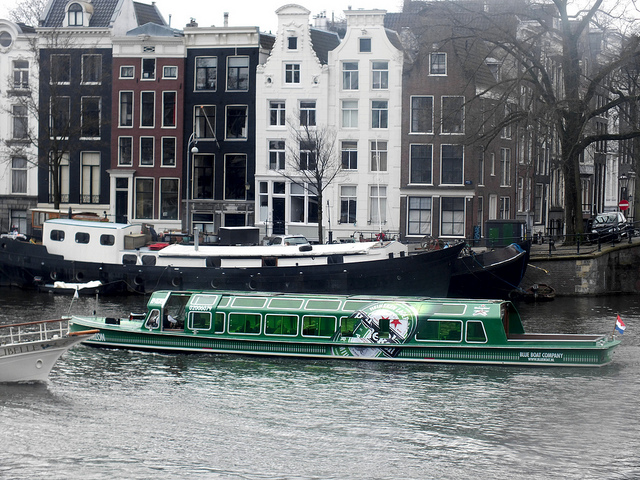

In [34]:
from IPython.display import Image
Image('/home/ec2-user/SageMaker/bloodcell/COCO_train2014_000000387731.jpg')

In [4]:
!nvidia-docker run -it -v /home/ec2-user/SageMaker/bloodcell/:/home/ec2-user/SageMaker/bloodcell/ \
    230755935769.dkr.ecr.us-east-1.amazonaws.com/yolo-tensorflow \
    predict_local \
    /home/ec2-user/SageMaker/bloodcell/data/coco.data \
    /home/ec2-user/SageMaker/bloodcell/cfg/yolov4.cfg \
    /home/ec2-user/SageMaker/bloodcell/yolov4.weights \
    /home/ec2-user/SageMaker/bloodcell/COCO_train2014_000000387731.jpg \
    /home/ec2-user/SageMaker/bloodcell/

 CUDA-version: 10000 (10020), GPU count: 1  
 OpenCV version: 3.2.0
Cannot load image data/labels/32_0.png
Cannot load image data/labels/33_0.png
Cannot load image data/labels/34_0.png
Cannot load image data/labels/35_0.png
Cannot load image data/labels/36_0.png
Cannot load image data/labels/37_0.png
Cannot load image data/labels/38_0.png
Cannot load image data/labels/39_0.png
Cannot load image data/labels/40_0.png
Cannot load image data/labels/41_0.png
Cannot load image data/labels/42_0.png
Cannot load image data/labels/43_0.png
Cannot load image data/labels/44_0.png
Cannot load image data/labels/45_0.png
Cannot load image data/labels/46_0.png
Cannot load image data/labels/47_0.png
Cannot load image data/labels/48_0.png
Cannot load image data/labels/49_0.png
Cannot load image data/labels/50_0.png
Cannot load image data/labels/51_0.png
Cannot load image data/labels/52_0.png
Cannot load image data/labels/53_0.png
Cannot load image data/labels/54_0.png
Cannot load image data/labels/55_0.

Cannot load image data/labels/118_3.png
Cannot load image data/labels/119_3.png
Cannot load image data/labels/120_3.png
Cannot load image data/labels/121_3.png
Cannot load image data/labels/122_3.png
Cannot load image data/labels/123_3.png
Cannot load image data/labels/124_3.png
Cannot load image data/labels/125_3.png
Cannot load image data/labels/126_3.png
Cannot load image data/labels/32_4.png
Cannot load image data/labels/33_4.png
Cannot load image data/labels/34_4.png
Cannot load image data/labels/35_4.png
Cannot load image data/labels/36_4.png
Cannot load image data/labels/37_4.png
Cannot load image data/labels/38_4.png
Cannot load image data/labels/39_4.png
Cannot load image data/labels/40_4.png
Cannot load image data/labels/41_4.png
Cannot load image data/labels/42_4.png
Cannot load image data/labels/43_4.png
Cannot load image data/labels/44_4.png
Cannot load image data/labels/45_4.png
Cannot load image data/labels/46_4.png
Cannot load image data/labels/47_4.png
Cannot load imag

   0 conv     32       3 x 3/ 1    608 x 608 x   3 ->  608 x 608 x  32 0.639 BF
   1 conv     64       3 x 3/ 2    608 x 608 x  32 ->  304 x 304 x  64 3.407 BF
   2 conv     64       1 x 1/ 1    304 x 304 x  64 ->  304 x 304 x  64 0.757 BF
   3 route  1 		                           ->  304 x 304 x  64 
   4 conv     64       1 x 1/ 1    304 x 304 x  64 ->  304 x 304 x  64 0.757 BF
   5 conv     32       1 x 1/ 1    304 x 304 x  64 ->  304 x 304 x  32 0.379 BF
   6 conv     64       3 x 3/ 1    304 x 304 x  32 ->  304 x 304 x  64 3.407 BF
   7 Shortcut Layer: 4,  wt = 0, wn = 0, outputs: 304 x 304 x  64 0.006 BF
   8 conv     64       1 x 1/ 1    304 x 304 x  64 ->  304 x 304 x  64 0.757 BF
   9 route  8 2 	                           ->  304 x 304 x 128 
  10 conv     64       1 x 1/ 1    304 x 304 x 128 ->  304 x 304 x  64 1.514 BF
  11 conv    128       3 x 3/ 2    304 x 304 x  64 ->  152 x 152 x 128 3.407 BF
  12 conv     64       1 x 1/ 1    152 x 152 x 128 ->  152 x 152 x  64 0.379

 106 conv   1024       3 x 3/ 1     19 x  19 x 512 ->   19 x  19 x1024 3.407 BF
 107 conv    512       1 x 1/ 1     19 x  19 x1024 ->   19 x  19 x 512 0.379 BF
 108 max                5x 5/ 1     19 x  19 x 512 ->   19 x  19 x 512 0.005 BF
 109 route  107 		                           ->   19 x  19 x 512 
 110 max                9x 9/ 1     19 x  19 x 512 ->   19 x  19 x 512 0.015 BF
 111 route  107 		                           ->   19 x  19 x 512 
 112 max               13x13/ 1     19 x  19 x 512 ->   19 x  19 x 512 0.031 BF
 113 route  112 110 108 107 	                   ->   19 x  19 x2048 
 114 conv    512       1 x 1/ 1     19 x  19 x2048 ->   19 x  19 x 512 0.757 BF
 115 conv   1024       3 x 3/ 1     19 x  19 x 512 ->   19 x  19 x1024 3.407 BF
 116 conv    512       1 x 1/ 1     19 x  19 x1024 ->   19 x  19 x 512 0.379 BF
 117 conv    256       1 x 1/ 1     19 x  19 x 512 ->   19 x  19 x 256 0.095 BF
 118 upsample                 2x    19 x  19 x 256 ->   38 x  38 x 256
 119 rou

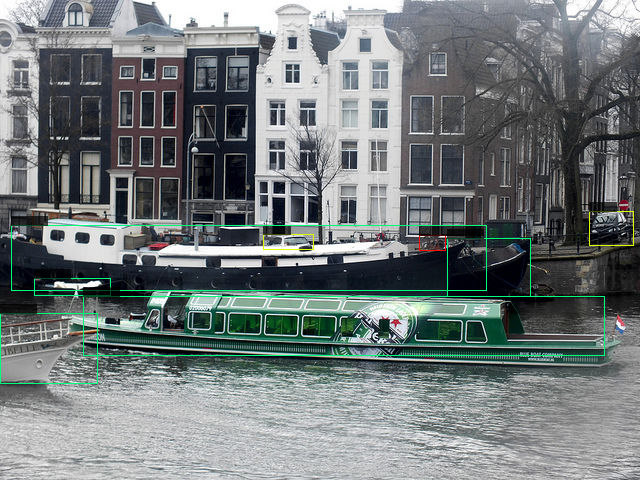

In [51]:
Image('/home/ec2-user/SageMaker/bloodcell/predictions.jpg')

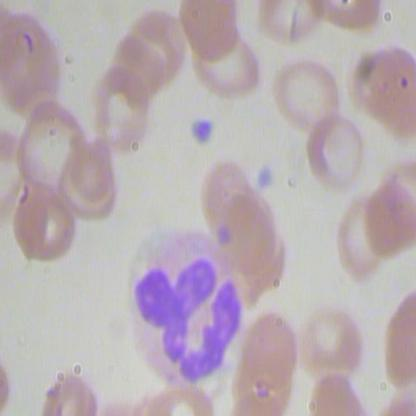

In [53]:
Image('/home/ec2-user/SageMaker/bloodcell/BloodImage_00203_jpg.rf.7e1e0baedaf6227f45f74ed5727ccec8.jpg')

In [52]:
!nvidia-docker run -it -v /home/ec2-user/SageMaker/bloodcell/:/home/ec2-user/SageMaker/bloodcell/ \
    230755935769.dkr.ecr.us-east-1.amazonaws.com/yolo-tensorflow \
    predict_local \
    /home/ec2-user/SageMaker/bloodcell/data/coco.data \
    /home/ec2-user/SageMaker/bloodcell/cfg/yolov4.cfg \
    /home/ec2-user/SageMaker/bloodcell/yolov4.weights \
    /home/ec2-user/SageMaker/bloodcell/BloodImage_00203_jpg.rf.7e1e0baedaf6227f45f74ed5727ccec8.jpg \
    /home/ec2-user/SageMaker/bloodcell/

 CUDA-version: 10000 (10020), GPU count: 1  
 OpenCV version: 3.2.0
Cannot load image data/labels/32_0.png
Cannot load image data/labels/33_0.png
Cannot load image data/labels/34_0.png
Cannot load image data/labels/35_0.png
Cannot load image data/labels/36_0.png
Cannot load image data/labels/37_0.png
Cannot load image data/labels/38_0.png
Cannot load image data/labels/39_0.png
Cannot load image data/labels/40_0.png
Cannot load image data/labels/41_0.png
Cannot load image data/labels/42_0.png
Cannot load image data/labels/43_0.png
Cannot load image data/labels/44_0.png
Cannot load image data/labels/45_0.png
Cannot load image data/labels/46_0.png
Cannot load image data/labels/47_0.png
Cannot load image data/labels/48_0.png
Cannot load image data/labels/49_0.png
Cannot load image data/labels/50_0.png
Cannot load image data/labels/51_0.png
Cannot load image data/labels/52_0.png
Cannot load image data/labels/53_0.png
Cannot load image data/labels/54_0.png
Cannot load image data/labels/55_0.

   0 conv     32       3 x 3/ 1    608 x 608 x   3 ->  608 x 608 x  32 0.639 BF
   1 conv     64       3 x 3/ 2    608 x 608 x  32 ->  304 x 304 x  64 3.407 BF
   2 conv     64       1 x 1/ 1    304 x 304 x  64 ->  304 x 304 x  64 0.757 BF
   3 route  1 		                           ->  304 x 304 x  64 
   4 conv     64       1 x 1/ 1    304 x 304 x  64 ->  304 x 304 x  64 0.757 BF
   5 conv     32       1 x 1/ 1    304 x 304 x  64 ->  304 x 304 x  32 0.379 BF
   6 conv     64       3 x 3/ 1    304 x 304 x  32 ->  304 x 304 x  64 3.407 BF
   7 Shortcut Layer: 4,  wt = 0, wn = 0, outputs: 304 x 304 x  64 0.006 BF
   8 conv     64       1 x 1/ 1    304 x 304 x  64 ->  304 x 304 x  64 0.757 BF
   9 route  8 2 	                           ->  304 x 304 x 128 
  10 conv     64       1 x 1/ 1    304 x 304 x 128 ->  304 x 304 x  64 1.514 BF
  11 conv    128       3 x 3/ 2    304 x 304 x  64 ->  152 x 152 x 128 3.407 BF
  12 conv     64       1 x 1/ 1    152 x 152 x 128 ->  152 x 152 x  64 0.379

 106 conv   1024       3 x 3/ 1     19 x  19 x 512 ->   19 x  19 x1024 3.407 BF
 107 conv    512       1 x 1/ 1     19 x  19 x1024 ->   19 x  19 x 512 0.379 BF
 108 max                5x 5/ 1     19 x  19 x 512 ->   19 x  19 x 512 0.005 BF
 109 route  107 		                           ->   19 x  19 x 512 
 110 max                9x 9/ 1     19 x  19 x 512 ->   19 x  19 x 512 0.015 BF
 111 route  107 		                           ->   19 x  19 x 512 
 112 max               13x13/ 1     19 x  19 x 512 ->   19 x  19 x 512 0.031 BF
 113 route  112 110 108 107 	                   ->   19 x  19 x2048 
 114 conv    512       1 x 1/ 1     19 x  19 x2048 ->   19 x  19 x 512 0.757 BF
 115 conv   1024       3 x 3/ 1     19 x  19 x 512 ->   19 x  19 x1024 3.407 BF
 116 conv    512       1 x 1/ 1     19 x  19 x1024 ->   19 x  19 x 512 0.379 BF
 117 conv    256       1 x 1/ 1     19 x  19 x 512 ->   19 x  19 x 256 0.095 BF
 118 upsample                 2x    19 x  19 x 256 ->   38 x  38 x 256
 119 rou

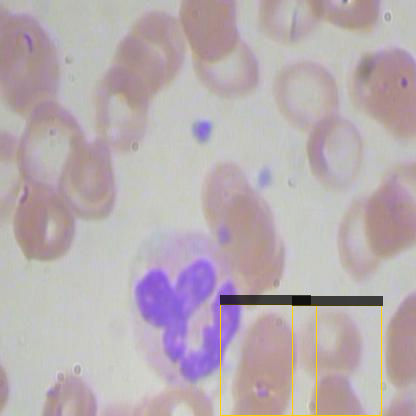

In [54]:
Image('/home/ec2-user/SageMaker/bloodcell/predictions.jpg')

#### Transfer Yolo V4 model into blood cells recognition 

In [25]:
!nvidia-docker run -it -v /home/ec2-user/SageMaker/bloodcell/:/home/ec2-user/SageMaker/bloodcell/ \
    230755935769.dkr.ecr.us-east-1.amazonaws.com/yolo-tensorflow \
    train_local \
    /home/ec2-user/SageMaker/bloodcell/data/obj.data \
    /home/ec2-user/SageMaker/bloodcell/cfg/custom-yolov4-detector.cfg \
    /home/ec2-user/SageMaker/bloodcell/yolov4.conv.137

 CUDA-version: 10000 (10020), GPU count: 1  
 OpenCV version: 3.2.0
 0 : compute_capability = 370, cudnn_half = 0, GPU: Tesla K80 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    608 x 608 x   3 ->  608 x 608 x  32 0.639 BF
   1 conv     64       3 x 3/ 2    608 x 608 x  32 ->  304 x 304 x  64 3.407 BF
   2 conv     64       1 x 1/ 1    304 x 304 x  64 ->  304 x 304 x  64 0.757 BF
   3 route  1 		                           ->  304 x 304 x  64 
   4 conv     64       1 x 1/ 1    304 x 304 x  64 ->  304 x 304 x  64 0.757 BF
   5 conv     32       1 x 1/ 1    304 x 304 x  64 ->  304 x 304 x  32 0.379 BF
   6 conv     64       3 x 3/ 1    304 x 304 x  32 ->  304 x 304 x  64 3.407 BF
   7 Shortcut Layer: 4,  wt = 0, wn = 0, outputs: 304 x 304 x  64 0.006 BF
   8 conv     64       1 x 1/ 1    304 x 304 x  64 ->  304 x 304 x  64 0.757 BF
   9 route  8 2 	                           ->  304 x 304 x 128 
  10 conv     64       1 x 1/ 1    30

 103 route  102 87 	                           ->   19 x  19 x1024 
 104 conv   1024       1 x 1/ 1     19 x  19 x1024 ->   19 x  19 x1024 0.757 BF
 105 conv    512       1 x 1/ 1     19 x  19 x1024 ->   19 x  19 x 512 0.379 BF
 106 conv   1024       3 x 3/ 1     19 x  19 x 512 ->   19 x  19 x1024 3.407 BF
 107 conv    512       1 x 1/ 1     19 x  19 x1024 ->   19 x  19 x 512 0.379 BF
 108 max                5x 5/ 1     19 x  19 x 512 ->   19 x  19 x 512 0.005 BF
 109 route  107 		                           ->   19 x  19 x 512 
 110 max                9x 9/ 1     19 x  19 x 512 ->   19 x  19 x 512 0.015 BF
 111 route  107 		                           ->   19 x  19 x 512 
 112 max               13x13/ 1     19 x  19 x 512 ->   19 x  19 x 512 0.031 BF
 113 route  112 110 108 107 	                   ->   19 x  19 x2048 
 114 conv    512       1 x 1/ 1     19 x  19 x2048 ->   19 x  19 x 512 0.757 BF
 115 conv   1024       3 x 3/ 1     19 x  19 x 512 ->   19 x  19 x1024 3.407 BF
 116 conv  

In [55]:
!nvidia-docker run -it -v /home/ec2-user/SageMaker/bloodcell/:/home/ec2-user/SageMaker/bloodcell/ \
    230755935769.dkr.ecr.us-east-1.amazonaws.com/yolo-tensorflow \
    predict_local \
    /home/ec2-user/SageMaker/bloodcell/data/obj.data \
    /home/ec2-user/SageMaker/bloodcell/cfg/custom-yolov4-detector.cfg \
    /home/ec2-user/SageMaker/bloodcell/last_backup/custom-yolov4-detector_final.weights \
    /home/ec2-user/SageMaker/bloodcell/BloodImage_00203_jpg.rf.7e1e0baedaf6227f45f74ed5727ccec8.jpg \
    /home/ec2-user/SageMaker/bloodcell/

 CUDA-version: 10000 (10020), GPU count: 1  
 OpenCV version: 3.2.0
Cannot load image data/labels/32_0.png
Cannot load image data/labels/33_0.png
Cannot load image data/labels/34_0.png
Cannot load image data/labels/35_0.png
Cannot load image data/labels/36_0.png
Cannot load image data/labels/37_0.png
Cannot load image data/labels/38_0.png
Cannot load image data/labels/39_0.png
Cannot load image data/labels/40_0.png
Cannot load image data/labels/41_0.png
Cannot load image data/labels/42_0.png
Cannot load image data/labels/43_0.png
Cannot load image data/labels/44_0.png
Cannot load image data/labels/45_0.png
Cannot load image data/labels/46_0.png
Cannot load image data/labels/47_0.png
Cannot load image data/labels/48_0.png
Cannot load image data/labels/49_0.png
Cannot load image data/labels/50_0.png
Cannot load image data/labels/51_0.png
Cannot load image data/labels/52_0.png
Cannot load image data/labels/53_0.png
Cannot load image data/labels/54_0.png
Cannot load image data/labels/55_0.

Cannot load image data/labels/75_2.png
Cannot load image data/labels/76_2.png
Cannot load image data/labels/77_2.png
Cannot load image data/labels/78_2.png
Cannot load image data/labels/79_2.png
Cannot load image data/labels/80_2.png
Cannot load image data/labels/81_2.png
Cannot load image data/labels/82_2.png
Cannot load image data/labels/83_2.png
Cannot load image data/labels/84_2.png
Cannot load image data/labels/85_2.png
Cannot load image data/labels/86_2.png
Cannot load image data/labels/87_2.png
Cannot load image data/labels/88_2.png
Cannot load image data/labels/89_2.png
Cannot load image data/labels/90_2.png
Cannot load image data/labels/91_2.png
Cannot load image data/labels/92_2.png
Cannot load image data/labels/93_2.png
Cannot load image data/labels/94_2.png
Cannot load image data/labels/95_2.png
Cannot load image data/labels/96_2.png
Cannot load image data/labels/97_2.png
Cannot load image data/labels/98_2.png
Cannot load image data/labels/99_2.png
Cannot load image data/la

   0 conv     32       3 x 3/ 1    608 x 608 x   3 ->  608 x 608 x  32 0.639 BF
   1 conv     64       3 x 3/ 2    608 x 608 x  32 ->  304 x 304 x  64 3.407 BF
   2 conv     64       1 x 1/ 1    304 x 304 x  64 ->  304 x 304 x  64 0.757 BF
   3 route  1 		                           ->  304 x 304 x  64 
   4 conv     64       1 x 1/ 1    304 x 304 x  64 ->  304 x 304 x  64 0.757 BF
   5 conv     32       1 x 1/ 1    304 x 304 x  64 ->  304 x 304 x  32 0.379 BF
   6 conv     64       3 x 3/ 1    304 x 304 x  32 ->  304 x 304 x  64 3.407 BF
   7 Shortcut Layer: 4,  wt = 0, wn = 0, outputs: 304 x 304 x  64 0.006 BF
   8 conv     64       1 x 1/ 1    304 x 304 x  64 ->  304 x 304 x  64 0.757 BF
   9 route  8 2 	                           ->  304 x 304 x 128 
  10 conv     64       1 x 1/ 1    304 x 304 x 128 ->  304 x 304 x  64 1.514 BF
  11 conv    128       3 x 3/ 2    304 x 304 x  64 ->  152 x 152 x 128 3.407 BF
  12 conv     64       1 x 1/ 1    152 x 152 x 128 ->  152 x 152 x  64 0.379

 106 conv   1024       3 x 3/ 1     19 x  19 x 512 ->   19 x  19 x1024 3.407 BF
 107 conv    512       1 x 1/ 1     19 x  19 x1024 ->   19 x  19 x 512 0.379 BF
 108 max                5x 5/ 1     19 x  19 x 512 ->   19 x  19 x 512 0.005 BF
 109 route  107 		                           ->   19 x  19 x 512 
 110 max                9x 9/ 1     19 x  19 x 512 ->   19 x  19 x 512 0.015 BF
 111 route  107 		                           ->   19 x  19 x 512 
 112 max               13x13/ 1     19 x  19 x 512 ->   19 x  19 x 512 0.031 BF
 113 route  112 110 108 107 	                   ->   19 x  19 x2048 
 114 conv    512       1 x 1/ 1     19 x  19 x2048 ->   19 x  19 x 512 0.757 BF
 115 conv   1024       3 x 3/ 1     19 x  19 x 512 ->   19 x  19 x1024 3.407 BF
 116 conv    512       1 x 1/ 1     19 x  19 x1024 ->   19 x  19 x 512 0.379 BF
 117 conv    256       1 x 1/ 1     19 x  19 x 512 ->   19 x  19 x 256 0.095 BF
 118 upsample                 2x    19 x  19 x 256 ->   38 x  38 x 256
 119 rou

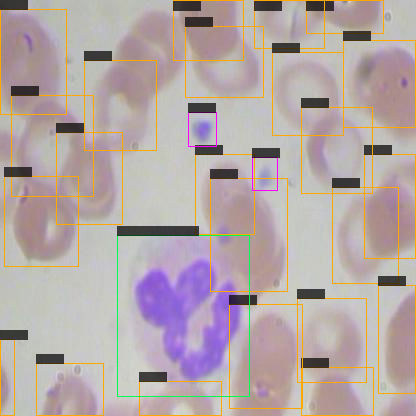

In [56]:
from IPython.display import Image
Image('/home/ec2-user/SageMaker/bloodcell/predictions.jpg')